## <b> Capstone Project  </b>

## <b>  Home Loan Default Risk Prediction System </b>



---

<b> Domain Background </b>

An important fraction of the population finds it difficult to get their home loans approved due to insufficient or absent credit history. This prevents them to buy their own dream homes and at times even forces them to rely on other sources of money which may be unreliable and have exorbitant interest rates. Conversely, it is a major challenge for banks and other finance lending agencies to decide for which candidates to approve housing loans. The credit history is not always a sufficient tool for decisions, since it is possible that those borrowers with a long credit history can still default on the loan and some people with a good chance of loan repayment may simply not have a sufficiently long credit history. 

A number of recent researchers have applied machine learning to predict the loan default risk. This is important since a machine learning-based classification tool to predict the loan default risk which uses more features than just the traditional credit history can be of great help for both, potential borrowers, and the lending institutions. At a personal level, this project will help me gain an insight into which factors are the most important indicators for a bank when making a loan decision in case I decide to apply for a housing loan in the future.

<b> Problem Statement </b>

 The problem can be described as, <i> “A binary classification problem where the inputs are various features describing the financial and behavioral history of the loan applicants, in order to predict whether the loan will be repaid or defaulted.” </i> 

<b> Project Novelty </b>

<i> The notebook provides a complete end-to-end workflow for building a binary classifier, and includes methods like automated feature engineering for connecting relational databases, comparison of different classifiers on imbalanced data, and hyperparameter tuning using Bayesian optimization. </i>

<b> Datasets and Inputs </b>

The [dataset files](https://www.kaggle.com/c/home-credit-default-risk/data) are provided on the Kaggle website in the form of multiple CSV files and are free to download. The dataset files are described as per Figure 1.

![image](https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png)
 
Figure 1- Description and connectivity of the Home Credit Default Risk dataset

As seen in Figure 1, the file application_{train|test}.csv contains the main table containing the training dataset (307511 samples) and test dataset (48744 samples), with each row representing one loan identified by the feature SK_ID_CURR. The training set contains the variable TARGET with binary values (0: the loan was repaid or 1: the loan was not repaid). There are many input files available, which will be analysed for input features to train the model. The large number of input features and training samples will allow me to identify the important factors and for constructing a credit default risk classification model.

<b> Project Design and Solution </b>

The project has been divided into five parts-

1. <u>Data Preparation</u> - Before starting the modeling, we need to import the necessary libraries and the datasets. If there are more than one files, then all need to be imported before we can look at the feature types and number of rows/columns in each file. 

2. <u>Exploratory Data Analysis</u> - After data importing, we can investigate the data and answer questions like- How many features are present and how are they interlinked? What is the data quality, are there missing values? What are the different data types, are there many categorical features? Is the data imbalanced? And most importantly, are there any obvious patterns between the predictor and response features? 

3. <u>Feature Engineering</u> - After exploring the data distributions, we can conduct feature engineering to prepare the data for model training. This includes operations like replacing outliers, imputing missing values, one-hot encoding categorical variables, and rescaling the data. Since there are number of relational databases, we can use extract, transform, load (ETL) processes using automated feature Engineering with [Featuretools](https://www.featuretools.com/) to connect the datasets. The additional features from these datasets will help improve the results over the base case (logistic regression). 

4. <u>Classifier Models: Training, Prediction and Comparison</u> - After the dataset is split into training and testing sets, we can correct the data imbalances by undersampling the majority class. Then, we can training the different classifier models (Logistic Regression, Random Forest, Decision Tree, Gaussian Naive Bayes, XGBoost, Gradient Boosting, LightGBM) and compare their performance on the test data using metrics like accuracy, F1-score and ROC AUC. After choosing the best classifier, we can use K-fold cross validation to select the best model. This will help us choose parameters that correspond to the best performance without creating a separate validation dataset.

5. <u>Hyperparameter Tuning</u> - After choosing the binary classifier, we can tune the hyperparameters for improving the model results through grid search, random search, and Bayesian optimization [(Hypertopt library)](https://github.com/hyperopt/hyperopt). The hyperparameter tuning process will use an objective function on the given domain space, and an optimization algorithm to give the results. The ROC AUC validation scores from all three methods for different iterations can be compared to see trends.

<b> Package/Library Requirements </b>

The following packages need to be installed for running the notebook.

1) sklearn  - For models and metrics<br>
2) warnings - For preventing warnings<br>
3) numpy - For basic matrix handling<br>
4) matplotlib - For figure plotting<br>
5) pandas - For creating dataframes<br>
6) seaborn - For figure plotting<br>
7) timeit - For tracking times<br>
8) os - for setting work directory<br>
9) random - For creating random seeds<br>
10) csv - For saving csv files<br>
11) json - For creating json files<br>
12) itertools - For creating iterators for efficient looping<br>
13) pprint - For pretty printing data structures<br>
14) pydash - for doing “stuff” in a functional way (utility library). <br>
15) gc -  Garbage collector for deleting data <br>
16) re - Raw string notation for regular expression patterns <br>
17) featuretools - Automated feature engineering <br>
18) xgboost - XGBoost model <br>
19) lightgbm - LightGBM model <br>
20) hyperopt - Bayesian hyperparameter optimization <br>

<b> References / Acknowledgements </b>

This notebook builds on scripts and explanations from other Jupyter notebooks publicly shared on Kaggle. The list is as follows-

1) [A Gentle Introduction](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction) <br>
2) [Introduction to Automated Feature Engineering](https://www.kaggle.com/willkoehrsen/automated-feature-engineering-basics) <br>
3) [Advanced Automated Feature Engineering](https://www.kaggle.com/willkoehrsen/tuning-automated-feature-engineering-exploratory) <br>
4) [Intro to Model Tuning: Grid and Random Search](https://www.kaggle.com/willkoehrsen/intro-to-model-tuning-grid-and-random-search) <br>
5) [Automated Model Tuning](https://www.kaggle.com/willkoehrsen/automated-model-tuning) <br>
6) [Home Credit Default Risk Extensive EDA](https://www.kaggle.com/gpreda/home-credit-default-risk-extensive-eda) <br>
7) [Home Credit Default Risk: Visualization & Analysis](https://www.kaggle.com/charlievbc/home-credit-default-risk-visualization-analysis) <br>
8) [Loan repayers v/s Loan defaulters - HOME CREDIT](https://www.kaggle.com/pavanraj159/loan-repayers-v-s-loan-defaulters-home-credit) <br>

---

---

## <b> 1.0 Data Preparation </b>

Before starting the modeling, we can import the necessary libraries and the data. If there are more data files, then all need to be imported and then we can look at the features types and number of rows/columns in each data file. 

---

<b> 1.1 Install/Import packages </b>

First all the packages required for the workflow are installed and imported

In [2]:

!pip install sklearn
!pip install warnings
!pip install numpy
!pip install matplotlib
!pip install pandas
!pip install seaborn
!pip install timeit
!pip install os
!pip install random
!pip install csv
!pip install json
!pip install itertools
!pip install pprint
!pip install pydash
!pip install gc
!pip install re
!pip install featuretools
!pip install xgboost
!pip install lightgbm
!pip install hyperopt

  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'


  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
      More information is available at
      https://github.com/scikit-learn/sklearn-pypi-packag

ERROR: Could not find a version that satisfies the requirement timeit (from versions: none)
ERROR: No matching distribution found for timeit
ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os
ERROR: Could not find a version that satisfies the requirement random (from versions: none)
ERROR: No matching distribution found for random
ERROR: Could not find a version that satisfies the requirement csv (from versions: none)
ERROR: No matching distribution found for csv
ERROR: Could not find a version that satisfies the requirement json (from versions: none)
ERROR: No matching distribution found for json
ERROR: Could not find a version that satisfies the requirement itertools (from versions: none)
ERROR: No matching distribution found for itertools
ERROR: Could not find a version that satisfies the requirement pprint (from versions: none)
ERROR: No matching distribution found for pprint


ERROR: Could not find a version that satisfies the requirement gc (from versions: none)
ERROR: No matching distribution found for gc
ERROR: Could not find a version that satisfies the requirement re (from versions: none)
ERROR: No matching distribution found for re


In [3]:
# Import required libraries/packages

import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns             
from timeit import default_timer as timer
import os
import random
import csv
import json
import itertools
import pprint
from pydash import at
import gc
import re

# import featuretools for automated feature engineering
import featuretools as ft 
from featuretools import selection

#Import sklearn helper metrics and transformations
from sklearn.base import TransformerMixin
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, KFold
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,roc_auc_score,classification_report,roc_curve,auc, f1_score

#Import models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb

#import library for hyperparameter optimization
from hyperopt import STATUS_OK
from hyperopt import hp, tpe, Trials, fmin
from hyperopt.pyll.stochastic import sample

---

<b> 1.2 Set working directory and import datasets </b>

The working directory is set to the address where data is located 

In [4]:
# File system manangement

os.chdir(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System") # set the working directory



Import the main data set and show the feature names and their types 

In [5]:
# Load training data from main file

application_train = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\application_train.csv")
application_train.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

For the main training data, there are 307511 total samples (each row a separate loan) with 122 features of types 41 integer, 65 float and 16 object datatypes. 

Out of these, the feature (SK_ID_CURR) serves as the index and TARGET is the response feature to be predicted. 

Then, all the other data files can be imported.

<i> Since, we do not have access to the labeled version of the test dataset, we will not use it, instead we will split part of the training dataset to use as the test data. </i>

In [6]:
# Load other data files

bureau                = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\bureau.csv")
bureau_balance        = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\bureau_balance.csv")
credit_card_balance   = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\credit_card_balance.csv")
installments_payments = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\installments_payments.csv")
pos_cash_balance      = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\POS_CASH_balance.csv")
previous_application  = pd.read_csv(r"C:\Users\chand\Downloads\Home Loan Default Risk Prediction System\Data\previous_application.csv")

---

<b> 1.3 Check dataset structures </b>

We can see the number of rows and columns in each file

In [8]:
print ("application_train     :",application_train.shape)
print ("bureau                :",bureau.shape)
print ("bureau_balance        :",bureau_balance.shape)
print ("credit_card_balance   :",credit_card_balance.shape)
print ("installments_payments :",installments_payments.shape)
print ("pos_cash_balance      :",pos_cash_balance.shape)
print ("previous_application  :",previous_application.shape)

application_train     : (307511, 122)
bureau                : (1716428, 17)
bureau_balance        : (27299925, 3)
credit_card_balance   : (3840312, 23)
installments_payments : (13605401, 8)
pos_cash_balance      : (10001358, 8)
previous_application  : (1670214, 37)


The first 3 columns of each dataset are displayed for data inspection

In [9]:
display("application_train")
display(application_train.head(3))
display("bureau")
display(bureau.head(3))
display("bureau_balance")
display(bureau_balance.head(3))
display("credit_card_balance")
display(credit_card_balance.head(3))
display("installments_payments")
display(installments_payments.head(3))
display("pos_cash_balance")
display(pos_cash_balance.head(3))
display("previous_application")
display(previous_application.head(3))

'application_train'

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


'bureau'

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN


'bureau_balance'

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C


'credit_card_balance'

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0


'installments_payments'

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000


'pos_cash_balance'

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0


'previous_application'

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0


---

## <b> 2.0 Exploratory Data Analysis </b>

After data importing, we can investigate the data and answer questions like- How many features are present and how are they interlinked? What is the data quality, are there missing values? What are the different data types, are there many categorical features? Is the data imbalanced? And most importantly, are there any obvious patterns between the predictor and response features? 

---

<b> 2.1 Checking data imbalance </b>

First we can observe the distribution of the predictor variable to check if the data is balanced or not. We can see that the dataset is imbalanced with the number of samples where loan is repaid (TARGET=0) more than 10 times the number of samples where loan is defaulted (TARGET=1)

There are 282686 loans repaid on time (TARGET=0) and 24825 loans defaulted (TARGET=1) in the dataset


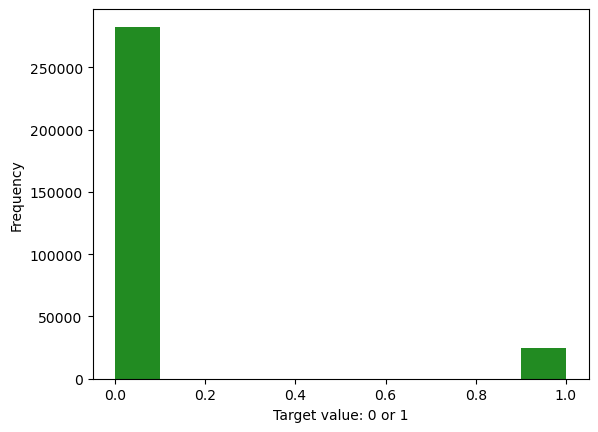

In [10]:
# Target data distribution

application_train['TARGET'].astype(int).plot.hist(color='forestgreen').set_xlabel('Target value: 0 or 1');

count = application_train['TARGET'].value_counts()
num_repaid = count[0]
num_default = count[1]

print("There are {} loans repaid on time (TARGET=0) and {} loans defaulted (TARGET=1) in the dataset".format(num_repaid, num_default))

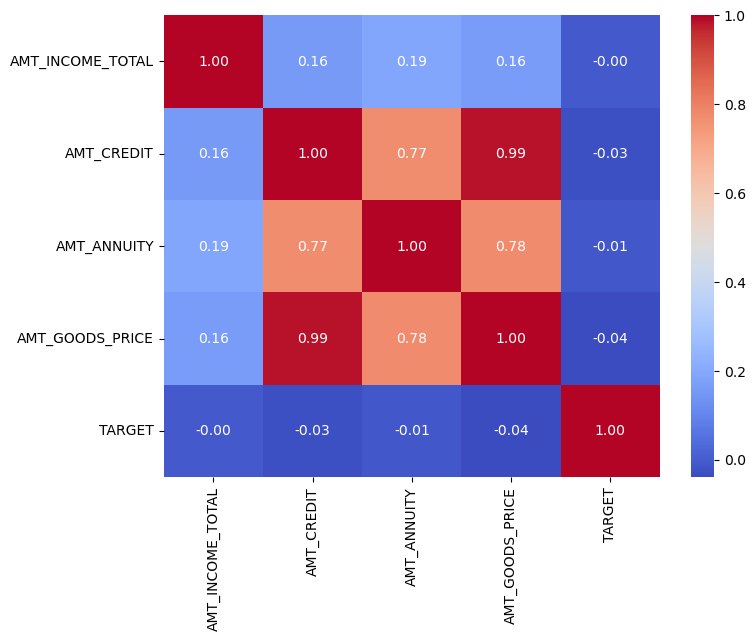

In [12]:
# correlation heatmap

import seaborn as sns
import matplotlib.pyplot as plt

cols = ['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','TARGET']

corr = application_train[cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.show()


---

<b> 2.2 Checking missing data </b>

Before we investigate the possible correlations between the features, it is important to check if the data contains missing values.

(0.0, 100.0)

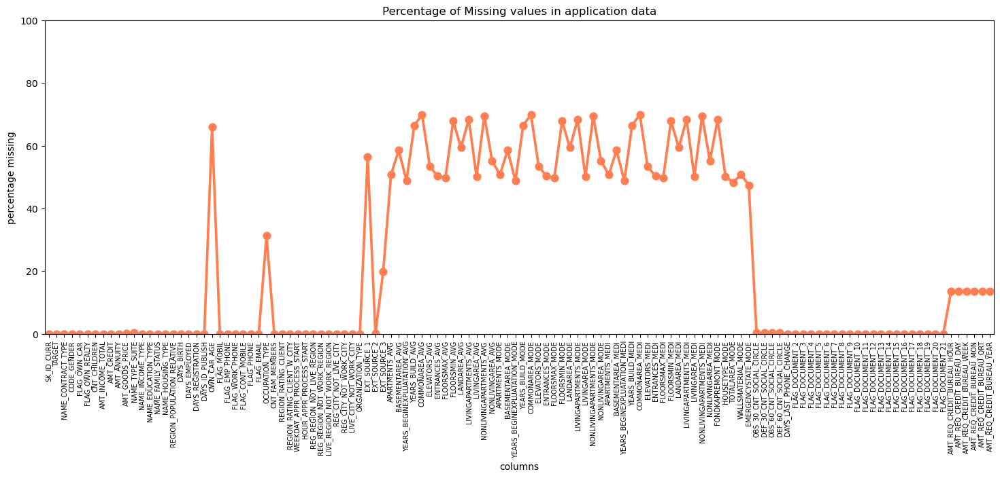

In [9]:
# Missing data in application (main) dataset

fig = plt.figure(figsize=(18,6))
miss_data = pd.DataFrame(
    (application_train.isnull().sum() / application_train.shape[0]) * 100
).reset_index()
miss_data.columns = ['column_name', 'pct_missing']  # Clear names!
ax = sns.pointplot(data=miss_data, x="column_name", y="pct_missing", color='coral')
plt.xticks(rotation =90,fontsize =7)
plt.title("Percentage of Missing values in application data")
plt.ylabel("percentage missing")
plt.xlabel("columns")
plt.ylim((0,100))

In the main training dataset, we can see that there are a number of features with missing values almost 50%. The features with missing data need to be discarded or missing values filled before training any model. Similar checks should be performed on the other datasets.

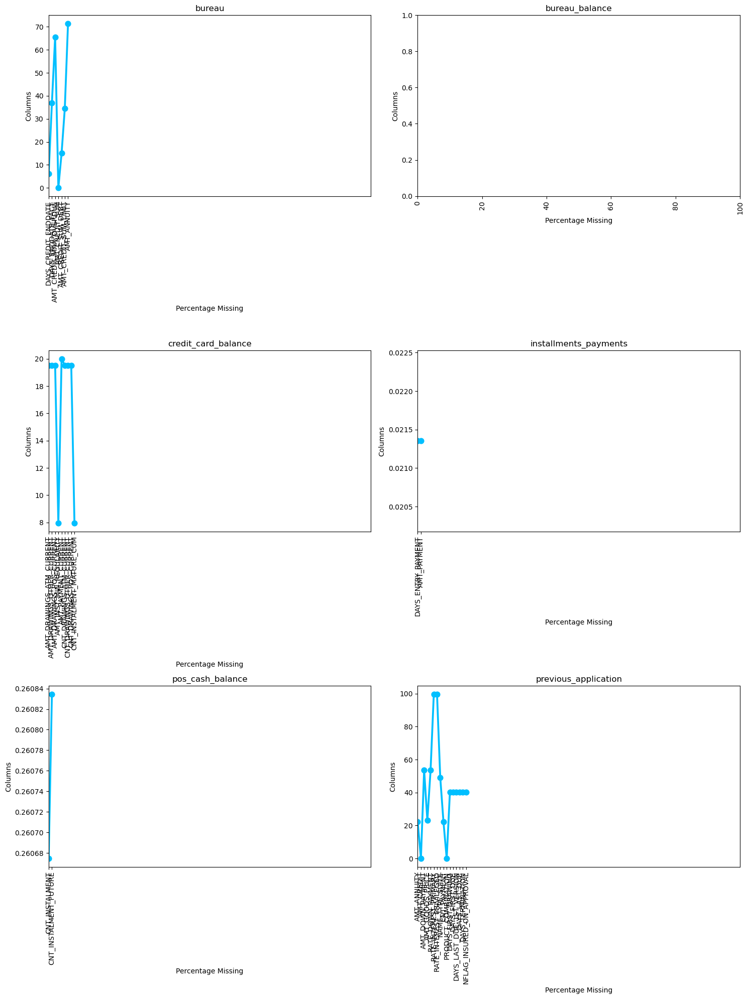

In [10]:
fig, axes = plt.subplots(3, 2, figsize=(15,20))  # 3 rows, 2 columns

# Helper function stays the same
def plot_missing_pct(df, ax, title):
    miss_data = pd.DataFrame(
        (df.isnull().sum() / df.shape[0]) * 100
    ).reset_index()
    miss_data.columns = ['column', 'pct_missing']
    miss_data = miss_data[miss_data['pct_missing'] > 0]

    sns.pointplot(data=miss_data, x="column", y="pct_missing",
                  color='deepskyblue', ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set_xlabel("Percentage Missing")
    ax.set_xlim(0, 100)
    ax.set_title(title)
    ax.set_ylabel("Columns")

# FIXED indexing (now matches 3x2 grid):
plot_missing_pct(bureau, axes[0,0], "bureau")
plot_missing_pct(bureau_balance, axes[0,1], "bureau_balance")      # Row 0, col 1
plot_missing_pct(credit_card_balance, axes[1,0], "credit_card_balance")
plot_missing_pct(installments_payments, axes[1,1], "installments_payments")
plot_missing_pct(pos_cash_balance, axes[2,0], "pos_cash_balance")  # Row 2 OK now!
plot_missing_pct(previous_application, axes[2,1], "previous_application")

plt.tight_layout()
plt.show()


In the above plots, we can see that while some datasets do not have any missing values, other datasets have significant sample values missing. These need to be addressed before training any models.

---

<b> 2.3 Examine feature correlations and distributions </b>

After inspecting any missing data, we can now continue the exploratory data analysis to see if any response features have significant differences for cases when loans are repaid as opposed to when loans are defaulted.








First create a function to create bar plots for each feature. 
Each figure contains the following- 

A) The total number of categories for each response feature

B) The fraction of each category with loan defaulted

In [11]:
def plot_bar_gen(feature, df = None, orientation_horizontal = True):
    
    if df is None:
        df = application_train
    else:
        df = df
    
    temp = df[feature].value_counts()
    df1 = pd.DataFrame({feature: temp.index,'Number of contracts': temp.values})

    # Calculate the percentage of target=1 per category value
    cat_perc = df[[feature, 'TARGET']].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by='TARGET', ascending=False, inplace=True)
    
    sns.set_color_codes("colorblind")
    
    if orientation_horizontal == True:
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        s1 = sns.barplot(y = feature, x="Number of contracts",data=df1)
        plt.subplot(122)
        s2 = sns.barplot(y = feature, x='TARGET', data=cat_perc)
        plt.xlabel('Fraction of loans defaulted', fontsize=12)
        plt.ylabel(feature, fontsize=12)
        
    else:
        plt.figure(figsize=(10,18))
        plt.subplot(211)
        s1 = sns.barplot(x = feature, y="Number of contracts",data=df1)
        s1.set_xticklabels(s1.get_xticklabels(),rotation=90)
        plt.subplot(212)
        s2 = sns.barplot(x = feature, y='TARGET', data=cat_perc)
        s2.set_xticklabels(s2.get_xticklabels(),rotation=90)
        plt.ylabel('Fraction of loans defaulted', fontsize=12)
        plt.xlabel(feature, fontsize=12)
    
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.subplots_adjust(wspace = 0.6)
    plt.show();

For the feature, type of contract, we see that there are more cash loans taken than revolving loans and they are also more defaulted.

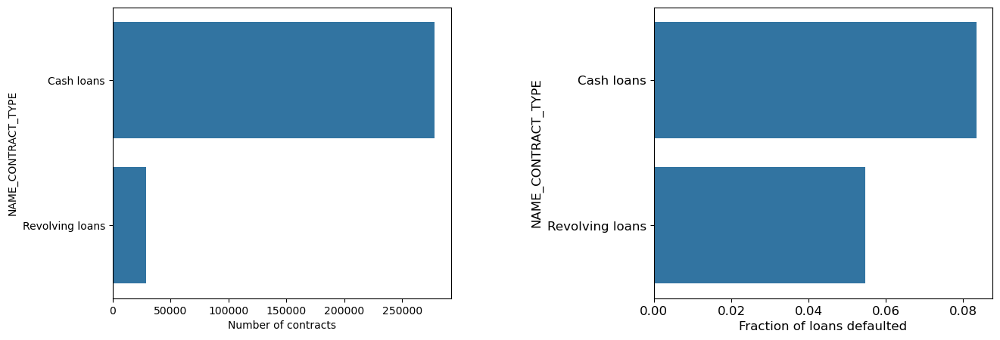

In [12]:
plot_bar_gen('NAME_CONTRACT_TYPE')

For the feature, gender, we see that there are more loans taken by males and they are also more defaulted by them.

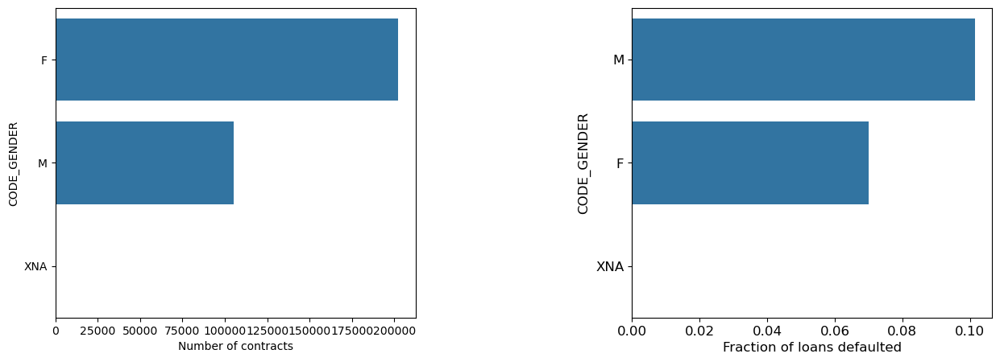

In [13]:
plot_bar_gen('CODE_GENDER')

For the feature, owning car, we see that there are more loans taken by those without car and they are also more defaulted by them.

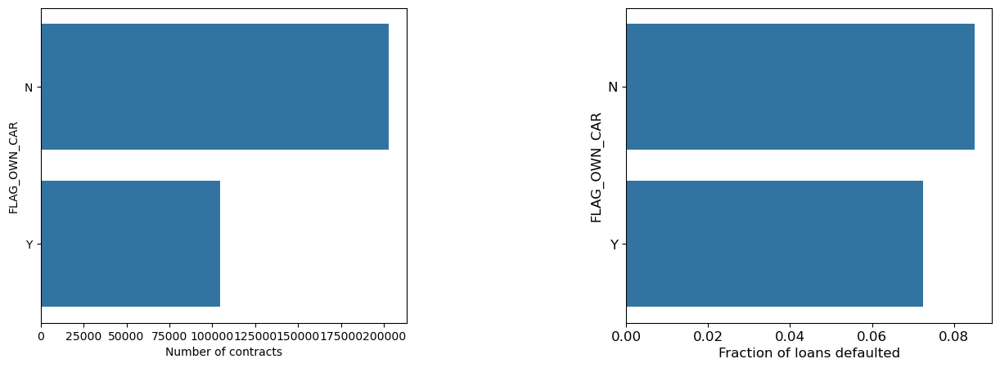

In [14]:
plot_bar_gen('FLAG_OWN_CAR')

For the feature, owning realty, we see that there are more loans taken by those with realty and they are defaulted slightly more by those without realty.

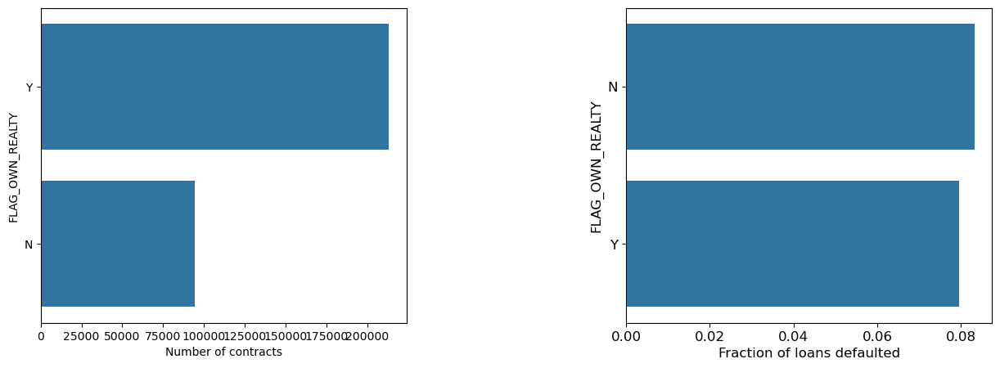

In [15]:
plot_bar_gen('FLAG_OWN_REALTY')

For the feature, family status, we see that there are more loans taken by those who are married and they are more defaulted by those who are in a civil marriage/single

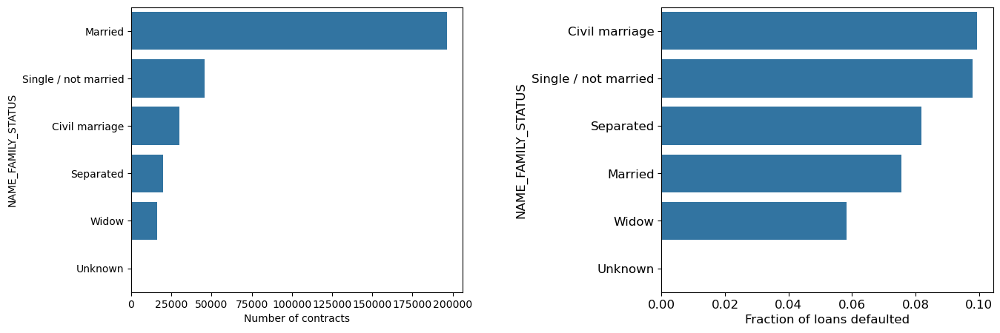

In [16]:
plot_bar_gen('NAME_FAMILY_STATUS')

For the feature, income type, we see that there are more loans taken by those who are working and they are more defaulted by those who are on maternity leave or unemployed

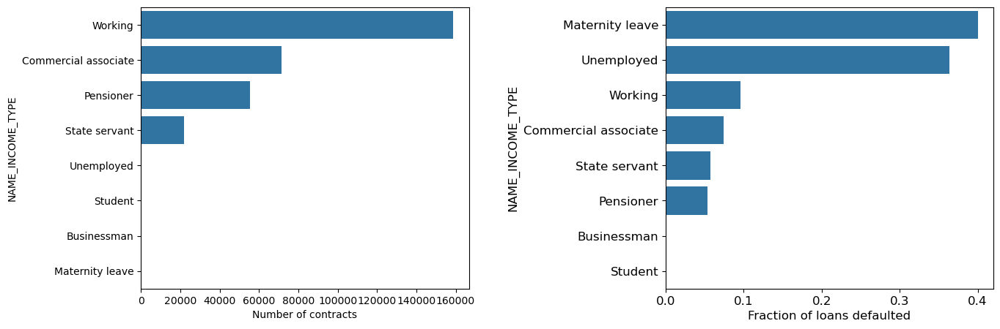

In [17]:
plot_bar_gen('NAME_INCOME_TYPE')

For the feature, children count, we see that there are more loans taken by those who have fewer children and they are more defaulted by those who have more children

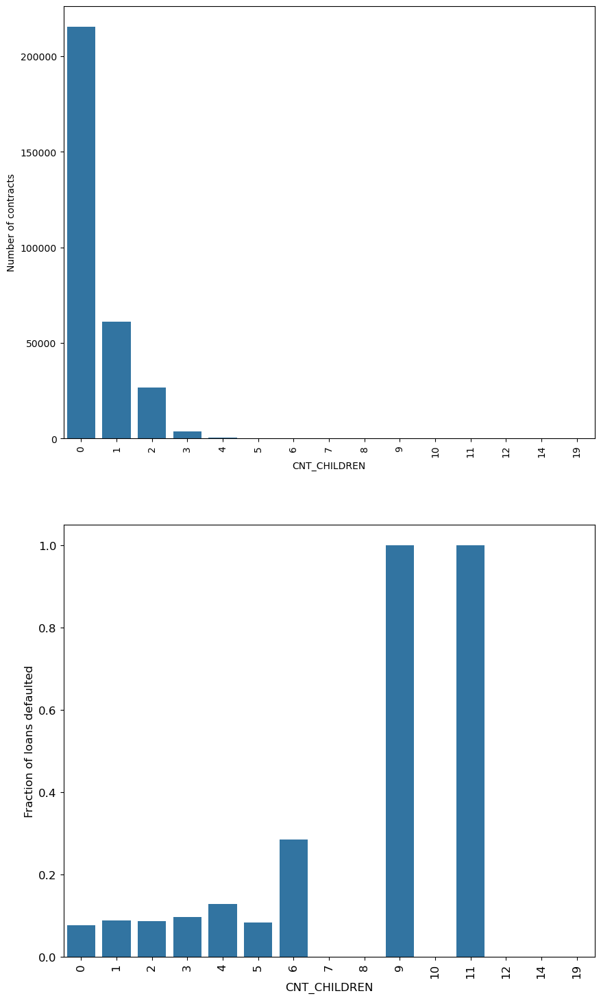

In [18]:
plot_bar_gen('CNT_CHILDREN',None,False)

For the feature, family member count, we see that there are more loans taken by those who have fewer family member and they are more defaulted by those who have more members

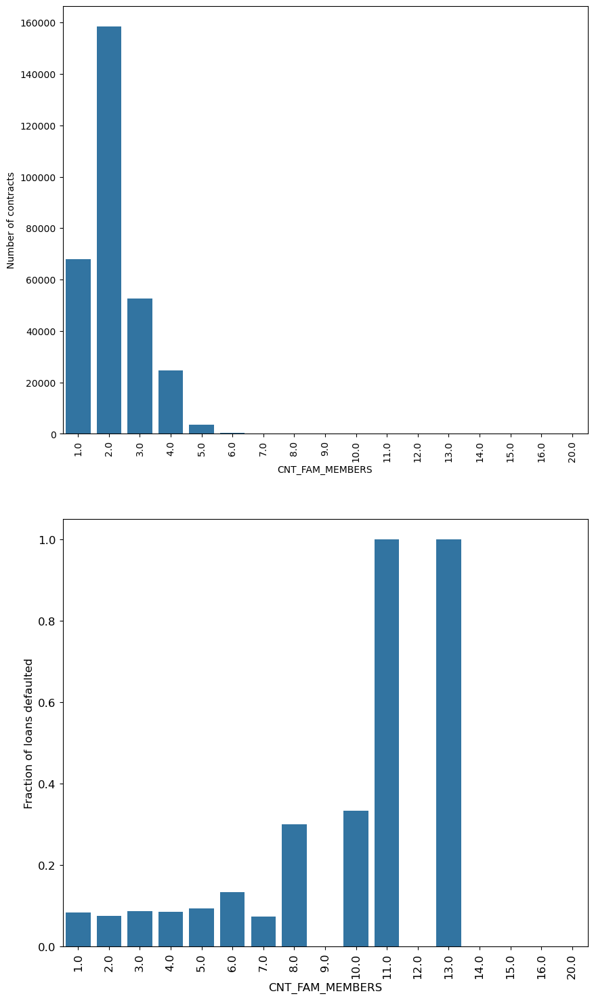

In [19]:
plot_bar_gen('CNT_FAM_MEMBERS',None,False)

For the feature, occupation type, we see that there are more loans taken categories like laborers and they are more defaulted by them too

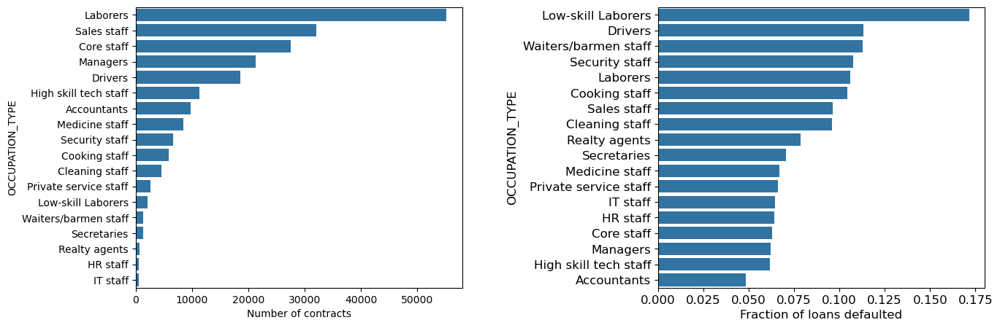

In [20]:
plot_bar_gen('OCCUPATION_TYPE')

For the feature, organization type, we see that there are more loans taken by categories like business entities, self-employed,and miscellaneous groups not categorized. They are more defaulted by those in certain industries

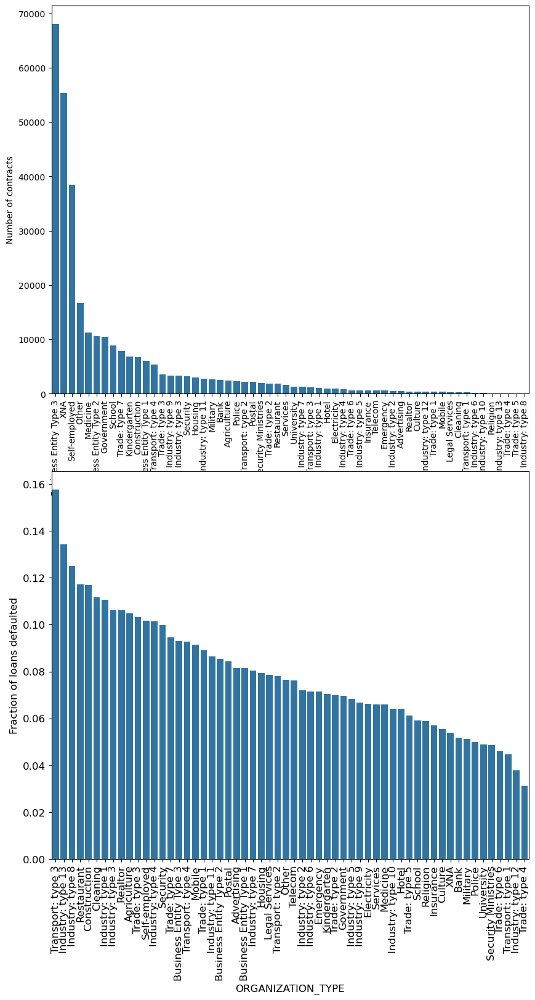

In [21]:
plot_bar_gen('ORGANIZATION_TYPE',None,False)

For the feature, education type, we see that there are more loans taken by those with secondary education and they are more defaulted by those who have less education

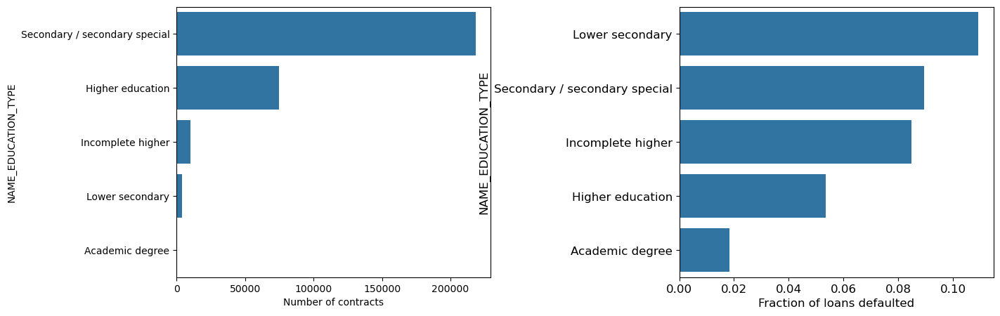

In [22]:
plot_bar_gen('NAME_EDUCATION_TYPE')

For the feature, housing type, we see that there are more loans taken by those with a house/apartment and they are more defaulted by those who have rented apartment or live with parents

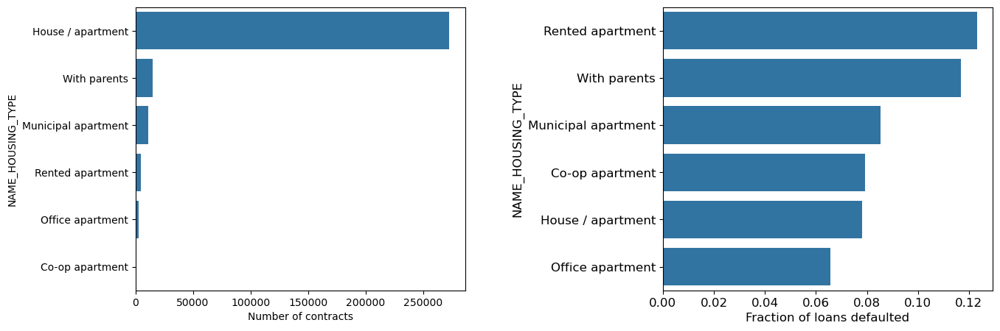

In [23]:
plot_bar_gen('NAME_HOUSING_TYPE')

For the feature, region not living region, we see that there are more loans are taken by those living in same region (0) and they are more defaulted by those who don't live in same region

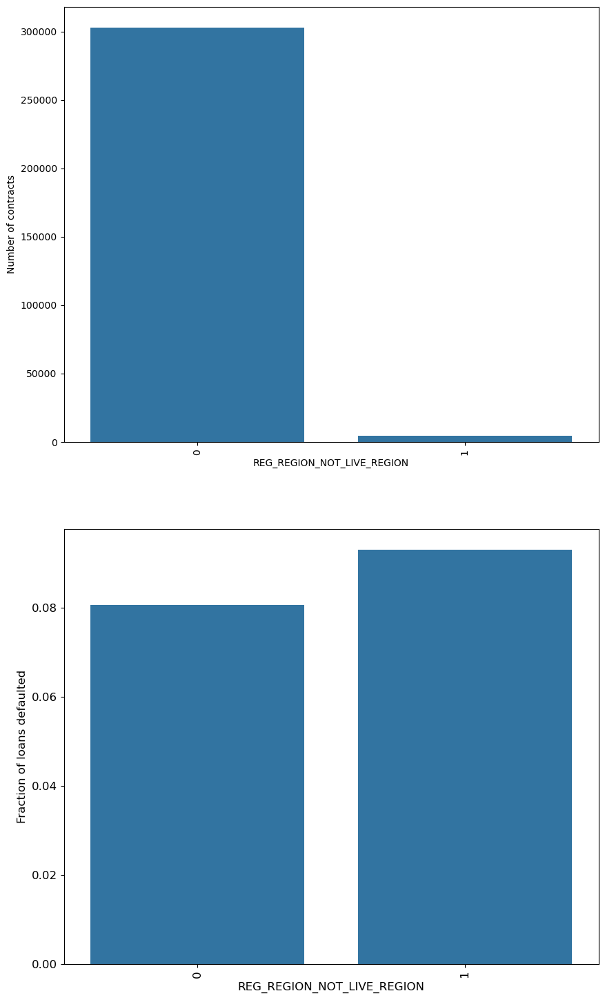

In [24]:
plot_bar_gen('REG_REGION_NOT_LIVE_REGION',None,False)

For the feature, region not work region, we see that there are more loans are taken by those working in same region (0) and they are more defaulted by those who don't work in same region

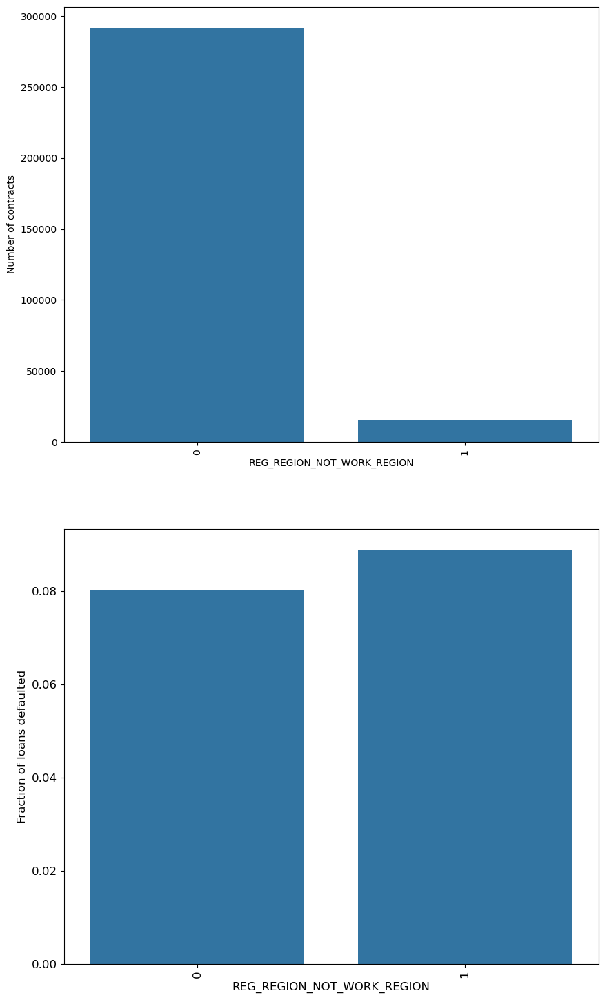

In [25]:
plot_bar_gen('REG_REGION_NOT_WORK_REGION',None,False)

For the feature, city not living city, we see that there are more loans are taken by those living in same city (0) and they are more defaulted by those who don't live in same city

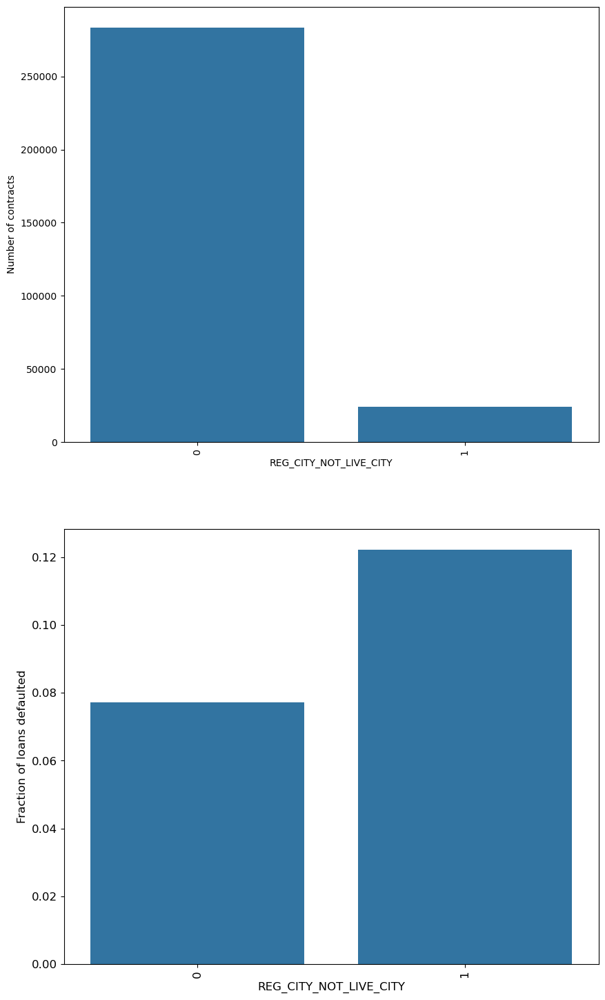

In [26]:
plot_bar_gen('REG_CITY_NOT_LIVE_CITY',None,False)

For the feature, city not working city, we see that there are more loans are taken by those working in same city (0) and they are more defaulted by those who don't work in same city

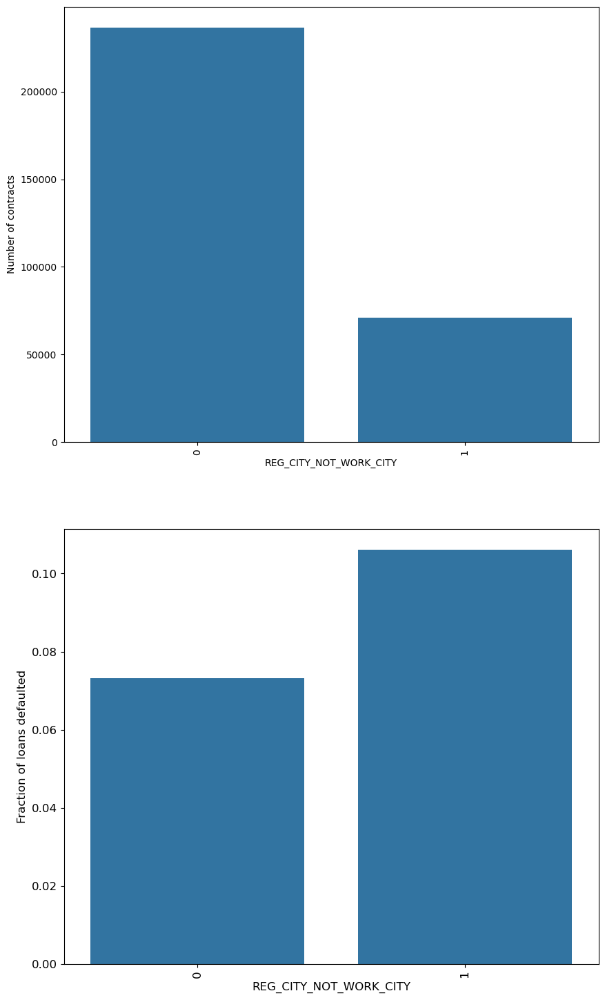

In [27]:
plot_bar_gen('REG_CITY_NOT_WORK_CITY',None,False)

For non-categorical features, we can plot bivariate distributions (with TARGET) to see if there is difference when loan is repaid or defaulted

In [13]:
# Plot distribution of one feature with or without paid/default shown separately

def plot_distribution_gen(feature,df=None,separate_target=False):
    if df is None:
        df = application_train
    else:
        df = df
        
    if separate_target == False:
        plt.figure(figsize=(10,6))
        plt.title("Distribution of %s" % feature)
        sns.distplot(df[feature].dropna(),color='red', kde=True,bins=100)
    else:
        t1 = df.loc[df['TARGET'] != 0]
        t0 = df.loc[df['TARGET'] == 0]
        
        plt.figure(figsize=(10,6))
        plt.title("Distribution of %s" % feature)
        sns.set_style('whitegrid')
#         sns.kdeplot(t1[feature], bw=0.5,label="Loan defaulted (TARGET=1)")
#         sns.kdeplot(t0[feature], bw=0.5,label="Loan repaid (TARGET = 0)")
        
        sns.kdeplot(df.loc[df['TARGET'] == 0, feature], label = 'target == 0')
        sns.kdeplot(df.loc[df['TARGET'] == 1, feature], label = 'target == 1')
    
        plt.ylabel('Density plot', fontsize=12)
        plt.xlabel(feature, fontsize=12)
        plt.legend(loc="best", labels=['Loan repaid (TARGET=0)', 'Loan defaulted (TARGET=1)'])
        locs, labels = plt.xticks()
        plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show();

The function below can be used to identify outliers in the data distribution

In [14]:
def get_thresh(feature):
    """ Outliers are usually > 3 standard deviations away from the mean. """
    ave=np.mean(application_train[feature])
    sdev=np.std(application_train[feature])
    threshold=round(ave+(3*sdev),2)
    print('Threshold for',feature,':',threshold)
    return threshold

For the feature, days employed, we see that there is an issue in the data with outliers with days employed more than 350000 days (958 years) ! This needs to be corrected

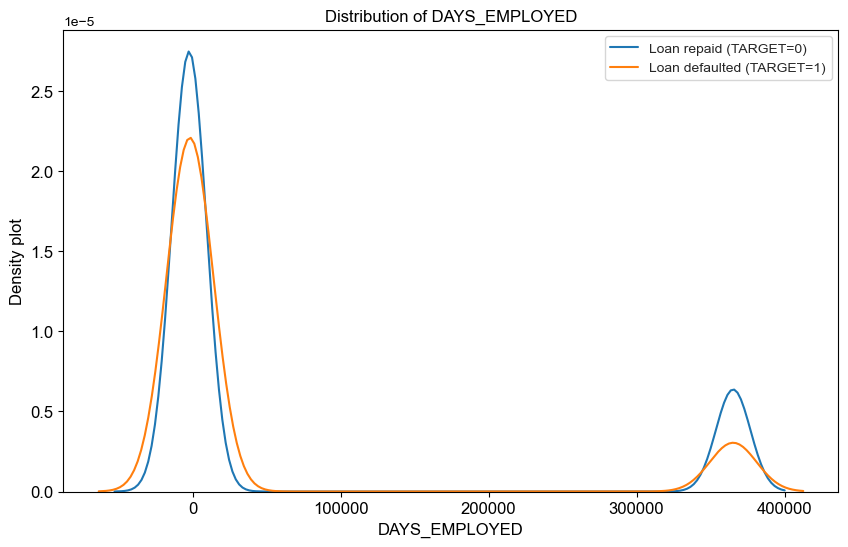

In [15]:
plot_distribution_gen('DAYS_EMPLOYED',None,True)

For the feature, amount income total, we see that there is an issue in the data, possibly due to outliers. This needs to be corrected

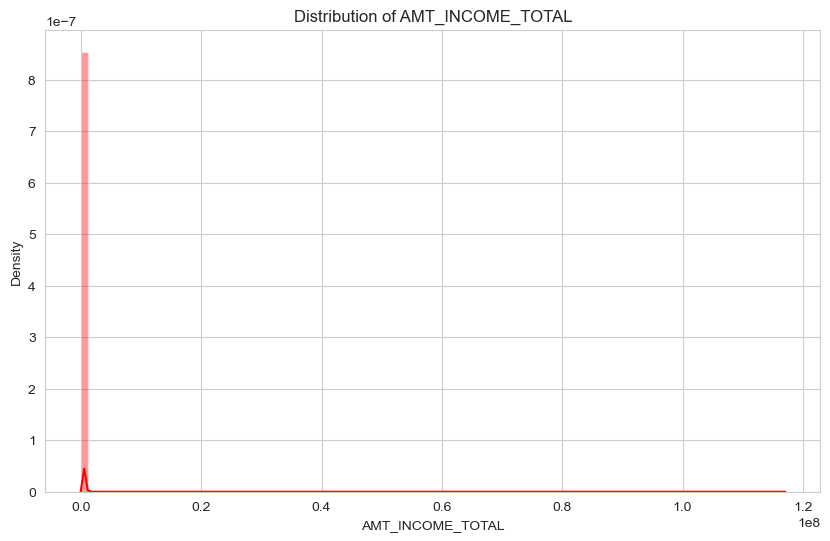

In [31]:
plot_distribution_gen('AMT_INCOME_TOTAL')

We can find the thresholds for outliers for the days employed and total income features, and replace the anomalous values with NaN

In [16]:
thresh_income = get_thresh('AMT_INCOME_TOTAL')
thresh_employment = get_thresh('DAYS_EMPLOYED')

anomalous_employment = application_train[application_train['DAYS_EMPLOYED'] > 0]
normal_employment = application_train[application_train['DAYS_EMPLOYED'] < 0]

print('The non-anomalies default on %0.2f%% of loans' % (100 * normal_employment['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anomalous_employment['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anomalous_employment))

Threshold for AMT_INCOME_TOTAL : 880166.2
Threshold for DAYS_EMPLOYED : 487641.66
The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


In [17]:
# Replace the anomalous values with nan

application_train['DAYS_EMPLOYED'].mask(application_train['DAYS_EMPLOYED'] > 0, inplace=True)
application_train['AMT_INCOME_TOTAL'].mask(application_train['AMT_INCOME_TOTAL'] > thresh_income, inplace=True)

The below function can be used to convert features which have days to years. The function can then be applied on all such features

In [18]:
def create_day_to_year(df,ls_cols,newcol):
    df[newcol] = round(np.abs(df[ls_cols[0]]/365))
    df.drop(columns=ls_cols,inplace=True);
    return df

For the feature, AGE, we can see that there are more number of loans defaulted by younger people

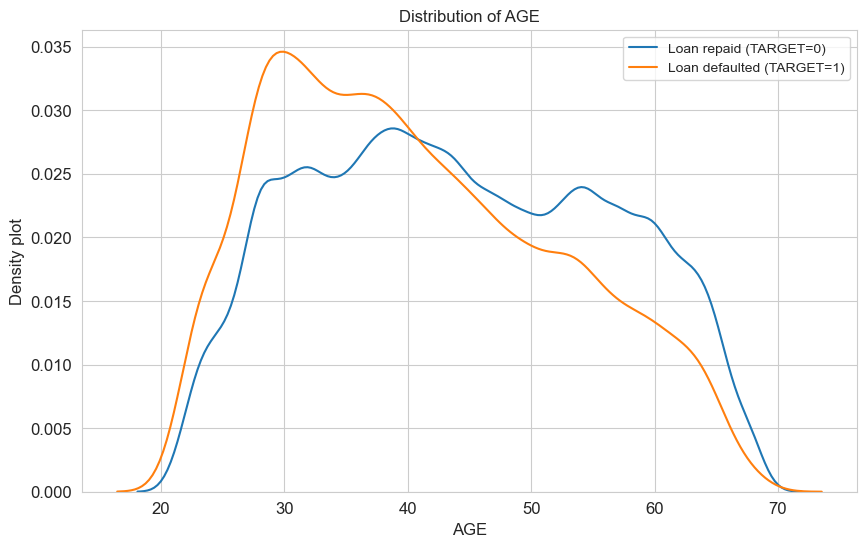

In [19]:
create_day_to_year(application_train,['DAYS_BIRTH'],'AGE');
plot_distribution_gen('AGE',None,True)

For the feature, YEARS_EMPLOYED, we can see that there are more number of loans defaulted by people who are employed for fewer years

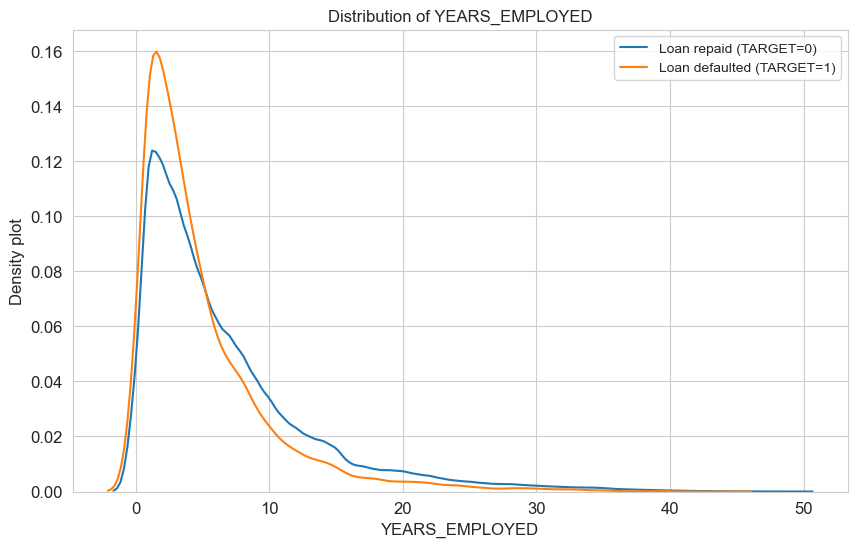

In [20]:
create_day_to_year(application_train,['DAYS_EMPLOYED'],'YEARS_EMPLOYED');
plot_distribution_gen('YEARS_EMPLOYED',None,True)

Now we can revisit the total income feature after removing outliers and we see the minor differences in distributions when loans are repaid or defaulted.

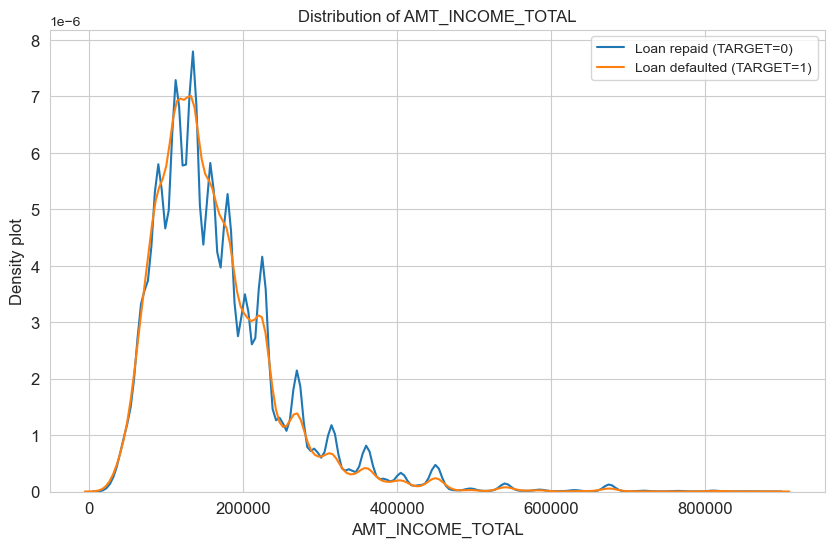

In [21]:
plot_distribution_gen('AMT_INCOME_TOTAL',None,True)

For the feature, EXT_SOURCE_1, we can see that as value of EXT_SOURCE_1 increases, the probability of loan being repaid also increases.

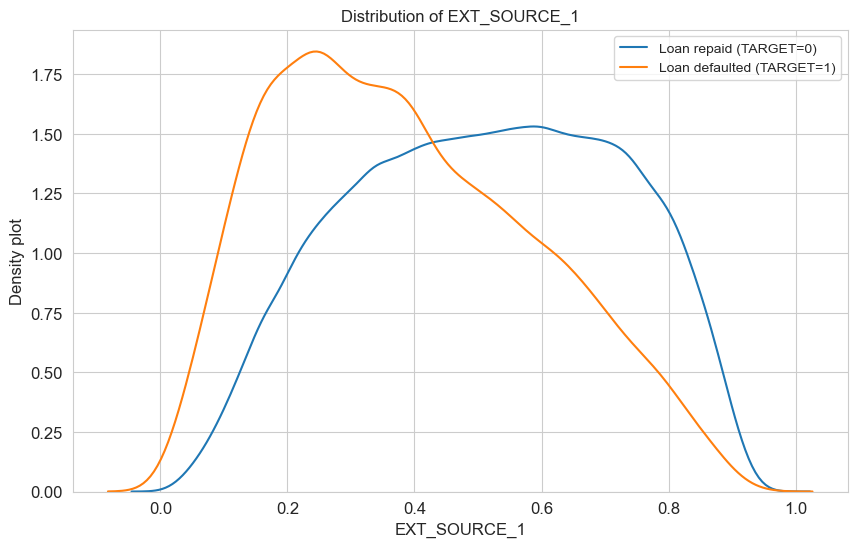

In [38]:
plot_distribution_gen('EXT_SOURCE_1',None,True)

For the feature, EXT_SOURCE_2, we can see that as value of EXT_SOURCE_2 increases, the probability of loan being repaid also increases.

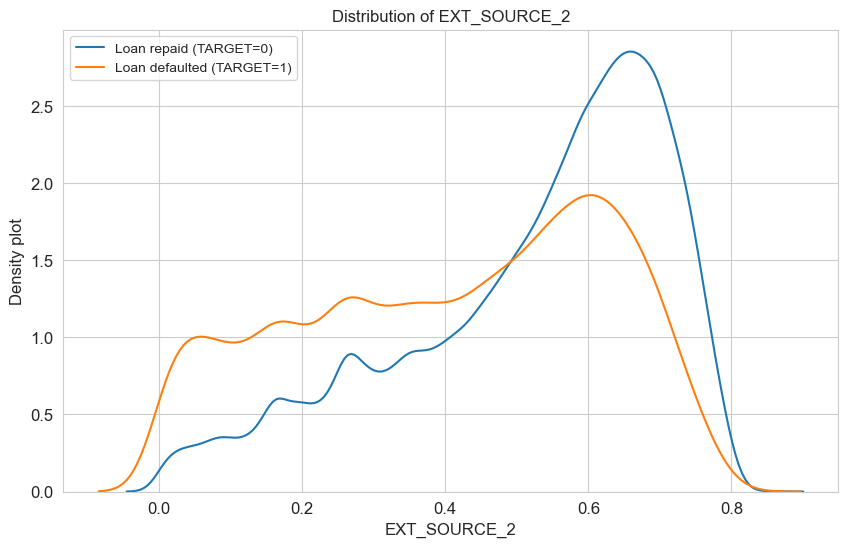

In [39]:
plot_distribution_gen('EXT_SOURCE_2',None,True)

For the feature, EXT_SOURCE_3, we can see that as value of EXT_SOURCE_3 increases, the probability of loan being repaid also increases.

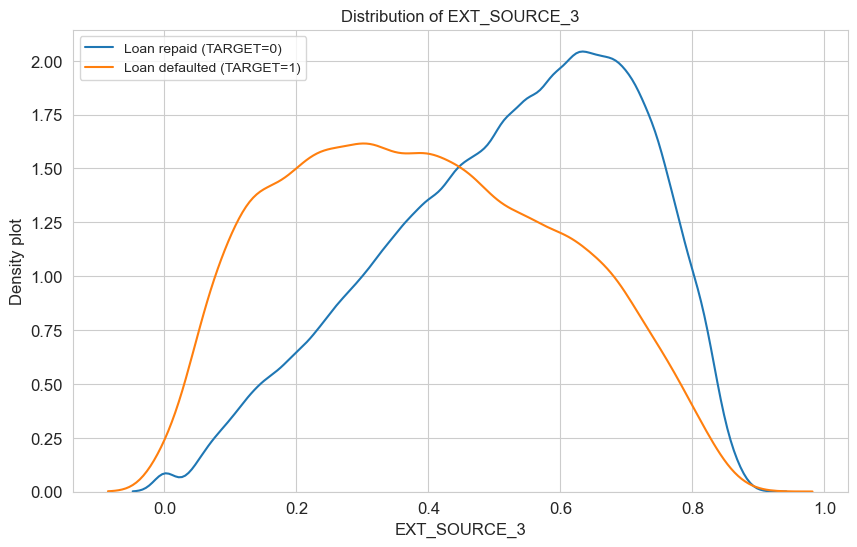

In [40]:
plot_distribution_gen('EXT_SOURCE_3',None,True)

All the features related to amount ('AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY', 'AMT_GOODS_PRICE') can be plotted along with TARGET as a heatmap to see if there are any possible correlations. We see in most cases that the repaid loans (TARGET = 0) have higher values.

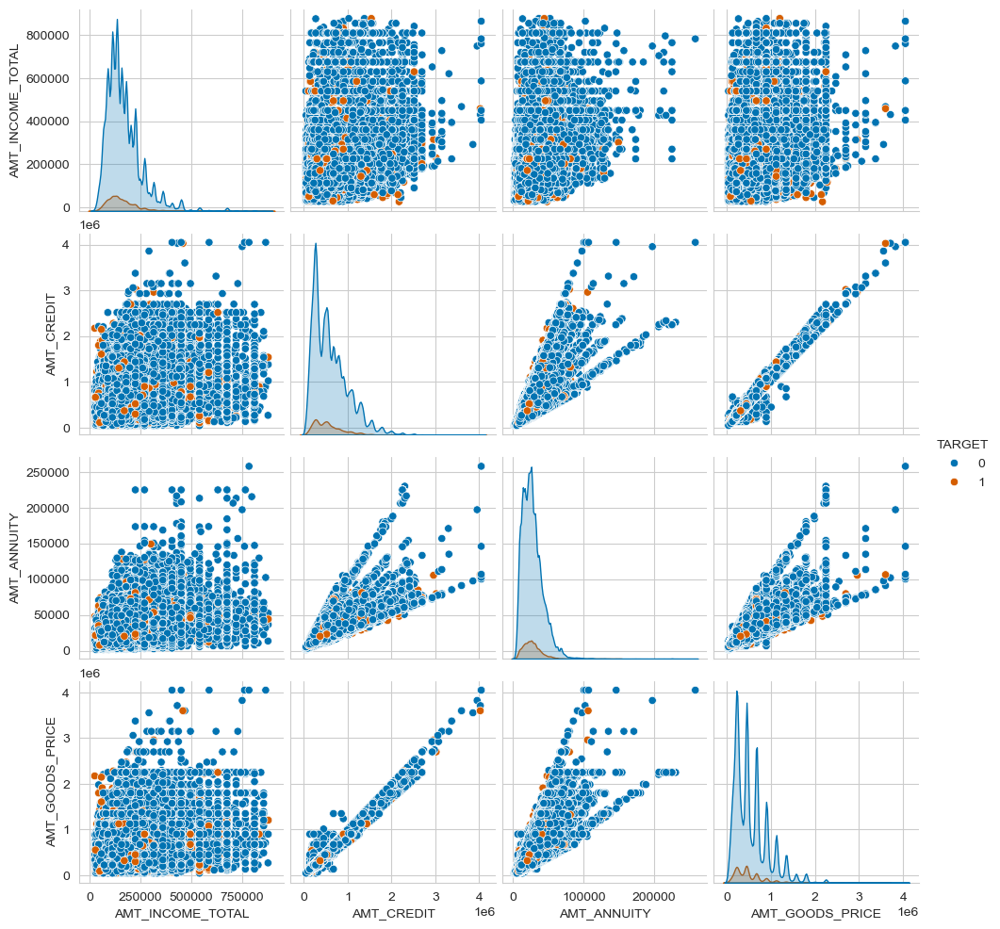

In [22]:
amt = application_train[[ 'AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY', 'AMT_GOODS_PRICE',"TARGET"]]
amt = amt[(amt["AMT_GOODS_PRICE"].notnull()) & (amt["AMT_ANNUITY"].notnull())]
g = sns.pairplot(amt,hue="TARGET",palette=["b","r"])  

plt.show()

For the feature, YEARS_REGISTRATION, we can see that there are more number of loans defaulted for lower number of years

In [23]:
create_day_to_year(application_train,['DAYS_REGISTRATION'],'YEARS_REGISTRATION');

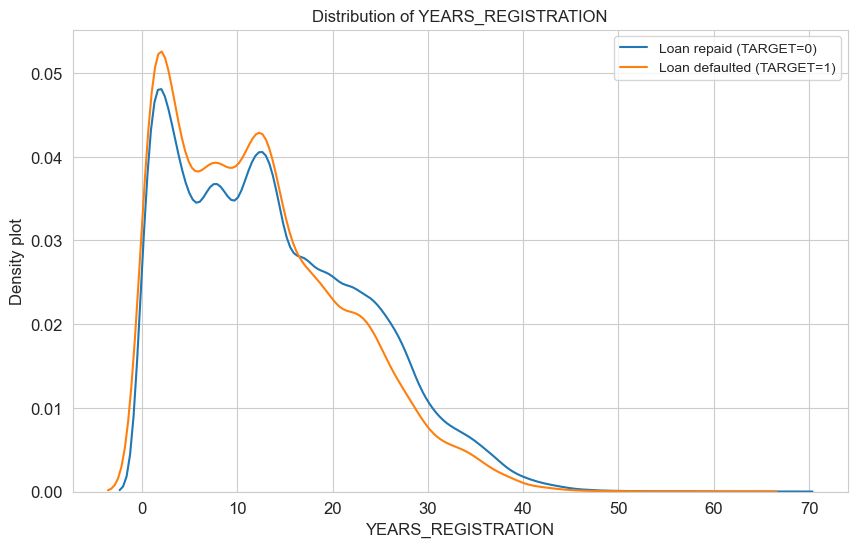

In [24]:
plot_distribution_gen('YEARS_REGISTRATION',None,True)

For the feature, YEARS_ID_PUBLISH, we can see that there are more number of loans defaulted for lower number of years

In [25]:
create_day_to_year(application_train,['DAYS_ID_PUBLISH'],'YEARS_ID_PUBLISH');

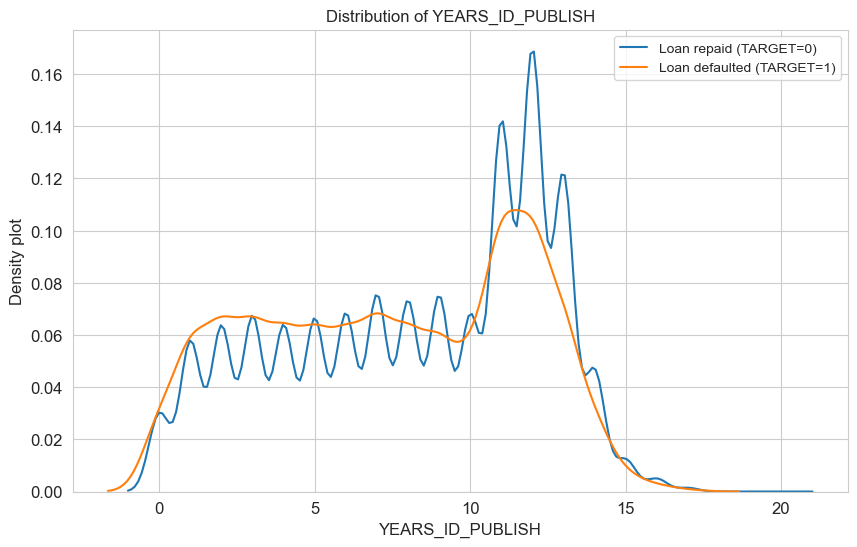

In [26]:
plot_distribution_gen('YEARS_ID_PUBLISH',None,True)

The below function can create income bands for the individuals using income ranges from income total

In [27]:
# Create INCOME_BAND to group individuals per income range

def create_income_band(df):
    df.loc[(df.AMT_INCOME_TOTAL < 30000),'INCOME_BAND'] = 1
    df.loc[(df.AMT_INCOME_TOTAL >= 30000)&(df.AMT_INCOME_TOTAL < 65000),'INCOME_BAND'] = 2
    df.loc[(df.AMT_INCOME_TOTAL >= 65000)&(df.AMT_INCOME_TOTAL < 95000),'INCOME_BAND'] = 3
    df.loc[(df.AMT_INCOME_TOTAL >= 95000)&(df.AMT_INCOME_TOTAL < 130000),'INCOME_BAND'] = 4
    df.loc[(df.AMT_INCOME_TOTAL >= 130000)&(df.AMT_INCOME_TOTAL < 160000),'INCOME_BAND'] = 5
    df.loc[(df.AMT_INCOME_TOTAL >= 160000)&(df.AMT_INCOME_TOTAL < 190000),'INCOME_BAND'] = 6
    df.loc[(df.AMT_INCOME_TOTAL >= 190000)&(df.AMT_INCOME_TOTAL < 220000),'INCOME_BAND'] = 7
    df.loc[(df.AMT_INCOME_TOTAL >= 220000)&(df.AMT_INCOME_TOTAL < 275000),'INCOME_BAND'] = 8
    df.loc[(df.AMT_INCOME_TOTAL >= 275000)&(df.AMT_INCOME_TOTAL < 325000),'INCOME_BAND'] = 9
    df.loc[(df.AMT_INCOME_TOTAL >= 325000),'INCOME_BAND'] = 10
    return df

In [28]:
create_income_band(application_train);

Observing the income bands for those with defaulting loans vs those with repaid loans, we do not see any major differences, but the distribution of repaid loans slightly increases for higher income bands. 

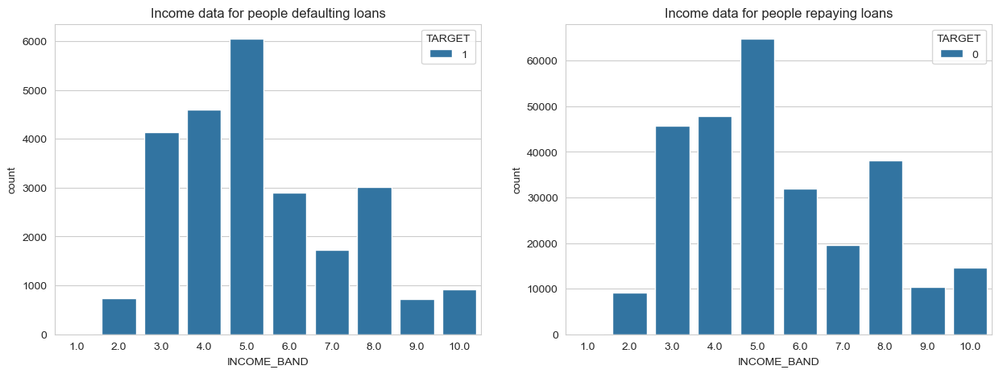

In [29]:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.countplot(data=application_train[application_train.TARGET==1],x='INCOME_BAND',hue='TARGET').set_title('Income data for people defaulting loans')
plt.subplot(122)
sns.countplot(data=application_train[application_train.TARGET==0],x='INCOME_BAND',hue='TARGET').set_title('Income data for people repaying loans')
application_train.drop(columns=['INCOME_BAND'],inplace=True);

---

The exploratory data analysis can be continued into other datasets. For example, in the dataset, bureau, the feature distributions can be seen below

In [30]:
application_bureau_train = application_train.merge(bureau, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [31]:
print("The resulting dataframe `application_bureau_train` has ",application_bureau_train.shape[0]," rows and ", 
      application_bureau_train.shape[1]," columns.")

The resulting dataframe `application_bureau_train` has  1465325  rows and  138  columns.


For the feature, CREDIT_ACTIVE, we see that there are more loans taken by those without active credit and they are more defaulted by those who have bad debt or sold credit

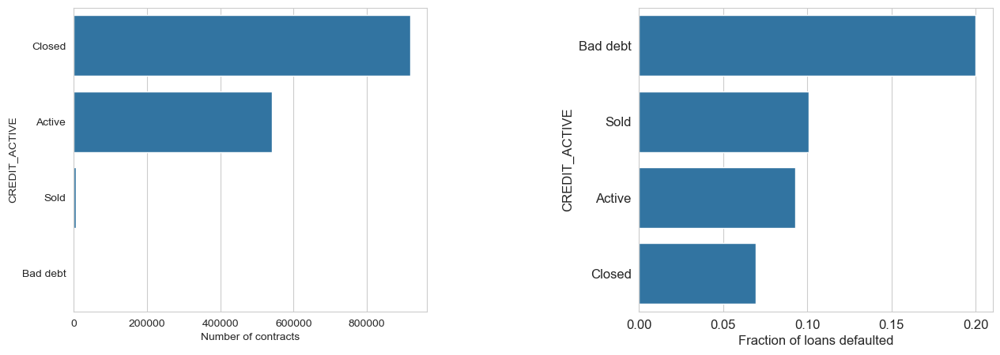

In [32]:
plot_bar_gen('CREDIT_ACTIVE',application_bureau_train)

For the feature, CREDIT_CURRENCY, we see that there are most loans taken by those using currency 1 and they are more defaulted by those who use currency 3

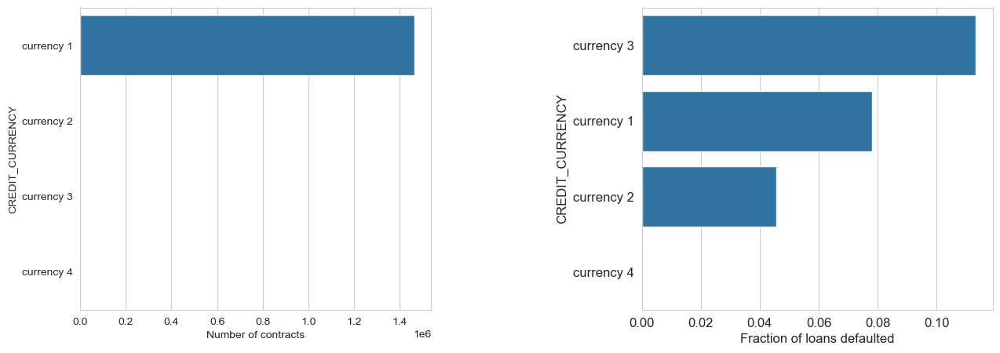

In [33]:
plot_bar_gen('CREDIT_CURRENCY',application_bureau_train)

For the feature, CREDIT_TYPE, we see that there are most loans taken by those with consumer credit/credit card and they are more defaulted by those who use loans for equipment purchase or microloans

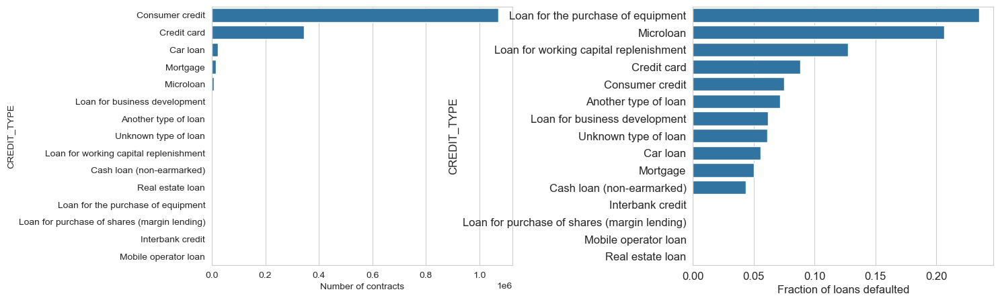

In [34]:
plot_bar_gen('CREDIT_TYPE',application_bureau_train)

---

Continuing the analysis for the dataset, previous_application, the feature distributions can be seen below

In [35]:
application_prev_train = application_train.merge(previous_application, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [36]:
print("The resulting dataframe `application_prev_train` has ",application_prev_train.shape[0]," rows and ", 
      application_prev_train.shape[1]," columns.")

The resulting dataframe `application_prev_train` has  1413701  rows and  158  columns.


For the feature, NAME_CONTRACT_TYPE, we see that there are almost equal previous cash/consumer loans and they are more defaulted by those whose info is not-available (XNA)

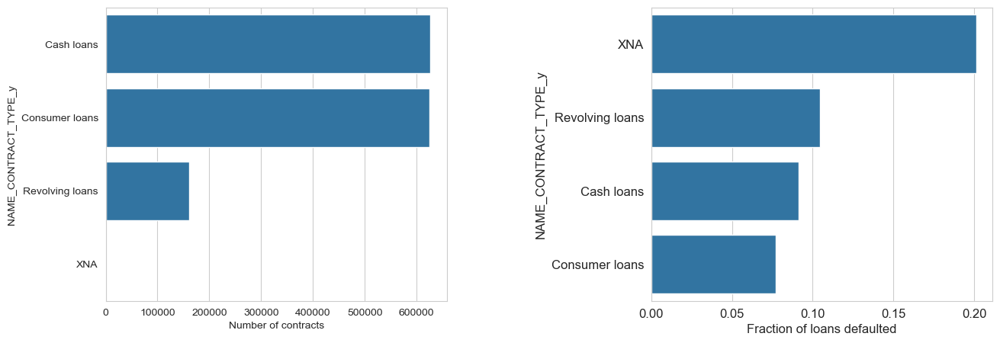

In [37]:
plot_bar_gen('NAME_CONTRACT_TYPE_y',application_prev_train)

For the feature, NAME_CASH_LOAN_PURPOSE, we see that most previous loans were for XAP/XNA and they are more defaulted by those who refuse to name the goal or for hobbies, car repairs

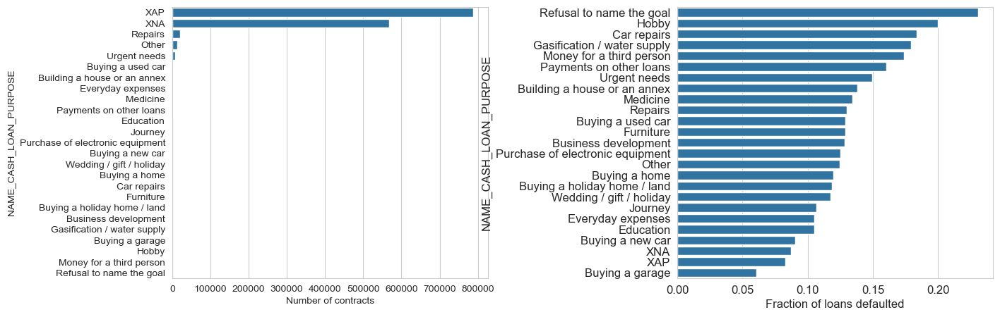

In [38]:
plot_bar_gen('NAME_CASH_LOAN_PURPOSE',application_prev_train)

For the feature, NAME_CONTRACT_STATUS, we see that most previous loans were approved and they are more defaulted by those who were refused or canceled

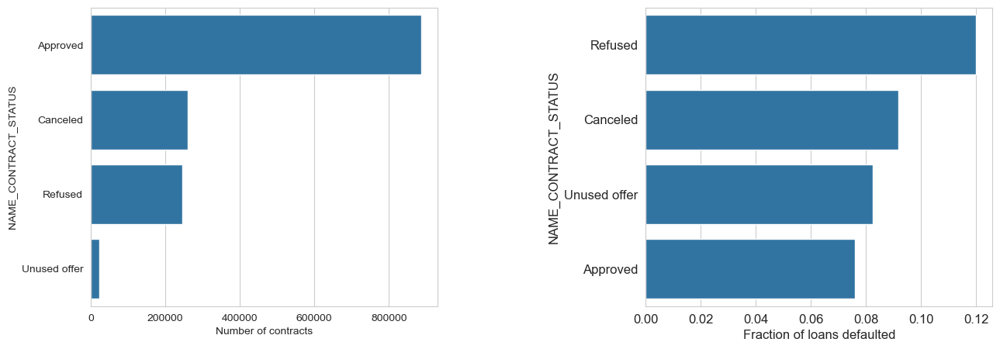

In [39]:
plot_bar_gen('NAME_CONTRACT_STATUS',application_prev_train)

For the feature, NAME_PAYMENT_TYPE, we see that most previous loans were for cash through bank and they are more defaulted by XNA and non-cash from account

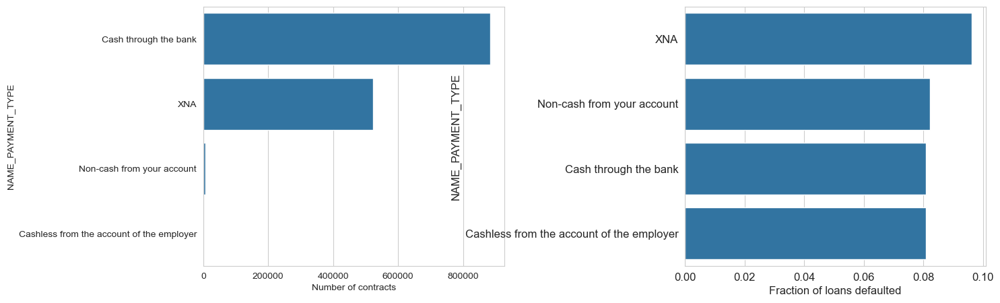

In [40]:
plot_bar_gen('NAME_PAYMENT_TYPE',application_prev_train)

For the feature, NAME_CLIENT_TYPE, we see that most previous loans were for repeated clients and they are more defaulted by those without information or new clients

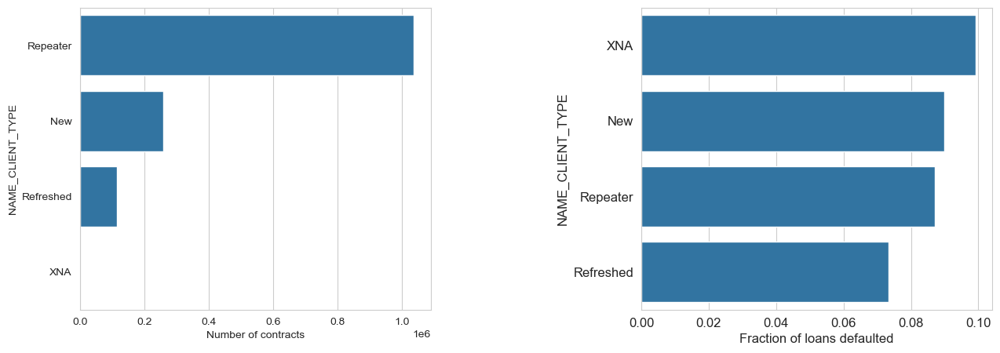

In [41]:
plot_bar_gen('NAME_CLIENT_TYPE',application_prev_train)

---

## <b> 3.0 Feature Engineering </b>

After exploring the data distributions, we can now conduct feature engineering to prepare the features before building the classifier models

---

<b> 3.1 Save/Load updated datasets </b> 

We create a checkpoint to save the updated data files if needed

In [42]:
## Save the csv files as a checkpoint if necessary (high memory and time intensive)

save_files = False

if save_files == True:
    application_train.to_csv('application_train_updated.csv', index = False)
    bureau.to_csv('bureau_updated.csv', index = False)
    bureau_balance.to_csv('bureau_balance_updated.csv', index = False)
    credit_card_balance.to_csv('credit_card_balance.csv', index = False)
    installments_payments.to_csv('installments_payments_updated.csv', index = False)
    pos_cash_balance.to_csv('pos_cash_balance_updated.csv', index = False)
    previous_application.to_csv('previous_application_updated.csv', index = False)

This is followed by the option of loading the previously saved updated datafiles, in case we are restarting the notebook

In [43]:
# Load csv files from checkpoint if necessary
# Otherwise, copy to new df and clean up memory 

load_files = False  # Existing variables in memory

if load_files == False:
    application_train_new = application_train.copy()
    bureau_new = bureau.copy()
    bureau_balance_new = bureau_balance.copy()
    credit_card_balance_new = credit_card_balance.copy()
    installments_payments_new = installments_payments.copy()
    pos_cash_balance_new = pos_cash_balance.copy()
    previous_application_new = previous_application.copy()
    
    gc.enable()
    del application_train, bureau, bureau_balance, credit_card_balance, installments_payments, pos_cash_balance, previous_application
    gc.collect()
    
else:
    application_train_new = pd.read_csv("application_train_updated.csv")
    bureau_new = pd.read_csv("bureau_updated.csv")            
    bureau_balance_new  = pd.read_csv("bureau_balance_updated.csv")      
    credit_card_balance_new  = pd.read_csv("credit_card_balance.csv")
    installments_payments_new = pd.read_csv("installments_payments_updated.csv")
    pos_cash_balance_new = pd.read_csv("pos_cash_balance_updated.csv")     
    previous_application_new  = pd.read_csv("previous_application_updated.csv")

---

<b> 3.2 Basic Feature Engineering (Replacing outliers, Imputing, One-hot encoding, Rescaling data) </b> 

First, a function is created and run to replace the day outliers previously seen across the data

In [44]:
def replace_day_outliers(df):
    """Replace 365243 with np.nan in any columns with DAYS"""
    for col in df.columns:
        if "DAYS" in col:
            df[col] = df[col].replace({365243: np.nan})

    return df

In [45]:
# Replace all the day outliers
application_train_new = replace_day_outliers(application_train_new)
bureau_new = replace_day_outliers(bureau_new )              
bureau_balance_new  = replace_day_outliers(bureau_balance_new)      
credit_card_balance_new  = replace_day_outliers(credit_card_balance_new) 
installments_payments_new = replace_day_outliers(installments_payments_new )
pos_cash_balance_new = replace_day_outliers(pos_cash_balance_new )   
previous_application_new  = replace_day_outliers(previous_application_new )

We create a function to remove columns which have missing values greater than 60%

In [46]:
#Function for removing columns with missing values more than 60%

def remove_missing_col(df):
    miss_data = pd.DataFrame((df.isnull().sum())*100/df.shape[0])
    miss_data_col=miss_data[miss_data[0]>60].index
    data_new  = df[[i for i in df.columns if i not in miss_data_col]]
    return data_new

Create a custom imputer function for both numerical and categorical variables

In [47]:
#Custom imputer for numerical and categorical variables (https://stackoverflow.com/questions/25239958/impute-categorical-missing-values-in-scikit-learn)

class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """Impute missing values.

        Columns of dtype object are imputed with the most frequent value 
        in column.

        Columns of other types are imputed with median of column.

        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].median() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

One-hot encoding of categorical variables in the main training dataset is done

In [48]:
# one-hot encoding of categorical variables
base_case_train = pd.get_dummies(application_train_new)

After one-hot encoding, the index variable (SK_ID_CURR) is temporarily removed and the main dataset has values imputed to replace missing samples, and the features are rescaled

In [49]:
# Drop the SK_ID from the training data
skid_temp = application_train_new['SK_ID_CURR']
train = base_case_train.drop(columns = ['SK_ID_CURR'])
    
# Feature names
features = list(train.columns)

# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range = (0, 1))

# Median imputation of missing values
train = DataFrameImputer().fit_transform(train)

## Repeat with the scaler
scaler.fit(train)
train = scaler.transform(train)
base_case_train = pd.DataFrame(data=train, columns=features)

print('Data shape: ', base_case_train.shape)

Data shape:  (307511, 245)


At this point, we can get the modified dataset for visual inspection. Looks ok!

In [50]:
base_case_train

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,1.0,0.0,0.207607,0.090287,0.090032,0.077441,0.256321,0.098901,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.286846,0.311736,0.132924,0.271605,0.045016,0.098901,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.049128,0.022472,0.020025,0.023569,0.134897,0.285714,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.128368,0.066837,0.109477,0.063973,0.107023,0.098901,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.112520,0.116854,0.078975,0.117845,0.392880,0.098901,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0.0,0.0,0.154781,0.052360,0.101176,0.046016,0.446855,0.098901,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
307507,0.0,0.0,0.054411,0.056067,0.040505,0.046016,0.344429,0.098901,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
307508,0.0,0.0,0.149498,0.157969,0.110618,0.135802,0.065247,0.098901,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
307509,1.0,0.0,0.170629,0.081175,0.072499,0.069585,0.069553,0.098901,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


The index variable is reattached to the dataset

In [51]:
base_case_train['SK_ID_CURR'] = skid_temp

print('Data shape: ', base_case_train.shape)

Data shape:  (307511, 246)


---

<b> 3.3 Base Case- Logistic Regression </b>

Before we do advanced feature engineering and connect the other data files, we can run a logistic regression to see how a simple classifier model behaves as a sanity check. For this purpose, the dataset is temporarily split into training/test sets.

In [52]:
# Train-Test split -- temporary
# Logistic regression - sanity check 

#splitting application_train_newdf into train and test
train,test = train_test_split(base_case_train,test_size=.25,random_state = 123)

#separating dependent and independent variables
train_X = train[[i for i in train.columns if i not in ['SK_ID_CURR'] + [ 'TARGET']]]
train_Y = train[["TARGET"]]

test_X  = test[[i for i in test.columns if i not in ['SK_ID_CURR'] + [ 'TARGET']]]
test_Y  = test[["TARGET"]]

We can create a function for the classifier to train on data, predict using test data, and visualize the metrics and feature importances

In [53]:
#Model function

def model_base(algorithm,dtrain_X,dtrain_Y,dtest_X,dtest_Y,cols=None):
    
    # Extract feature names
    feature_names = list(dtrain_X.columns)
    # Empty array for feature importances
    feature_importance_values = np.zeros(len(feature_names))
    
    algorithm.fit(dtrain_X[cols],dtrain_Y)
    predictions = algorithm.predict(dtest_X[cols])
    prediction_probabilities = algorithm.predict_proba(dtest_X[cols])[:,1]
    
    # Record the feature importances
    feature_importance_values= algorithm.coef_[0]
    feature_importance_values = np.absolute(feature_importance_values)
#     # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})
    
    print (algorithm)
    print ("Accuracy score : ", accuracy_score(predictions,dtest_Y))
    print ("classification report :\n",classification_report(predictions,dtest_Y))
    fpr , tpr , thresholds   = roc_curve(dtest_Y,prediction_probabilities)
    
    fig = plt.figure(figsize=(10,8))
    ax  = fig.add_subplot(111)
    ax.plot(fpr,tpr,label   = ["Area under curve : ",auc(fpr,tpr)],linewidth=2,linestyle="dotted")
    ax.plot([0,1],[0,1],linewidth=2,linestyle="dashed")
    plt.legend(loc="best")
    plt.title("ROC-CURVE & AREA UNDER CURVE")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    
    return feature_importances

On running the base case - logistic regression model, we see that it does a good job of predicting the cases when loan is repaid (f1-score = 0.96) but does not perform well to predict when loans are defaulted (f1-score = 0.02). 

However, since this is an imbalanced dataset, the accuracy score is still high at 0.9184. Hence, it is preferred to use test AUC ROC which does not depend on data imbalance and has a value of 0.7454 for the base case.  

LogisticRegression()
Accuracy score :  0.9184812300007804
classification report :
               precision    recall  f1-score   support

         0.0       1.00      0.92      0.96     76746
         1.0       0.01      0.51      0.02       132

    accuracy                           0.92     76878
   macro avg       0.50      0.71      0.49     76878
weighted avg       1.00      0.92      0.96     76878



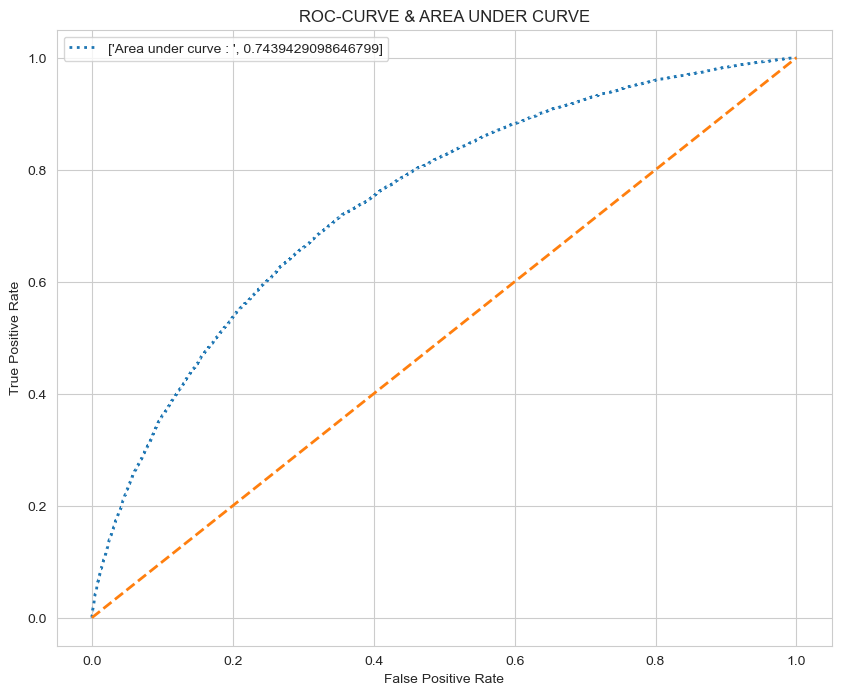

In [54]:
logit = LogisticRegression()
feature_importances_logit_base = model_base(logit,train_X,train_Y,test_X,test_Y,train_X.columns)

The Receiver Operating Characteristic Area under curve (ROC AUC) is a metric for which can be suitably applied for imbalanced datasets since it does not generate 0 or 1 predictions, but rather a probability between 0 and 1. It measures the false positive rate (x-axis) vs true positive rate (y-axis). The area under curve (AUC) is the area between a model's ROC curve and the diagonal indicating a model with naive random guessing. If the ROC curve is more to the left/top of the diagonal, is indicates better performance with a higher ROC AUC.

---

After training a base case, we can return to feature engineering.

First we apply our limited domain knowlege to create few more variables, specifically ratios accounting for the credit income %, annuity income %, credit term, and fraction of years employed  

In [55]:
#Domain knowledge

application_train_new['CREDIT_INCOME_PERCENT'] = application_train_new['AMT_CREDIT'] / application_train_new['AMT_INCOME_TOTAL']
application_train_new['ANNUITY_INCOME_PERCENT'] = application_train_new['AMT_ANNUITY'] / application_train_new['AMT_INCOME_TOTAL']
application_train_new['CREDIT_TERM'] = application_train_new['AMT_ANNUITY'] / application_train_new['AMT_CREDIT']
application_train_new['YEARS_EMPLOYED_PERCENT'] = application_train_new['YEARS_EMPLOYED'] / application_train_new['AGE']

---

<b> 3.4 Automated Feature Engineering using Featuretools </b>

To improve the results over the base case and to fully utilized the different datasets provided, we need to use feature engineering and relational database techniques to connect the various datasets. This will be done using extract, transform, load (ETL) techniques for automated feature engineering using [Featuretools](https://www.featuretools.com/)

We create a function to identify boolean variables in main training data and run it

In [56]:
import featuretools as ft
from woodwork.logical_types import Boolean, Ordinal

In [57]:
# Iterate through the columns and record the Boolean columns

def bool_type(df):
    col_type = {}

    for col in df.columns:
        # Numeric columns with only two unique values
        if (df[col].dtype != 'object') and (df[col].nunique() <= 2):
            col_type[col] = Boolean

    print('Number of boolean variables:', len(col_type))
    return col_type


In [58]:
application_train_new['REGION_RATING_CLIENT'].unique()
application_train_new['REGION_RATING_CLIENT_W_CITY'].unique()

array([2, 1, 3], dtype=int64)

In [59]:
train_col_type = bool_type(application_train_new)

train_col_type['REGION_RATING_CLIENT'] = Ordinal(order=[1, 2, 3])
train_col_type['REGION_RATING_CLIENT_W_CITY'] = Ordinal(order=[1, 2, 3])

Number of boolean variables: 33


We start connecting the datasets using Featuretools by first creating an entity and then adding the datasets while connected by a common index (SK_ID_CURR). For other datasets, indexes are created as necessary 

In [60]:
# Entity set with id applications
es = ft.EntitySet(id = 'clients')

In [61]:
es = es.add_dataframe(
    dataframe_name='app',
    dataframe=application_train_new,
    index='SK_ID_CURR',
    logical_types=train_col_type
)


In [62]:
# Bureau data
es = es.add_dataframe(
    dataframe_name='bureau',
    dataframe=bureau_new,
    index='SK_ID_BUREAU'
)

In [63]:
# Previous applications
es = es.add_dataframe(
    dataframe_name='previous',
    dataframe=previous_application_new,
    index='SK_ID_PREV'
)

In [64]:
# Bureau balance (no unique index)
es = es.add_dataframe(
    dataframe_name='bureau_balance',
    dataframe=bureau_balance_new,
    make_index=True,
    index='bureau_balance_index'
)

In [65]:
# POS cash balance
es = es.add_dataframe(
    dataframe_name='cash',
    dataframe=pos_cash_balance_new,
    make_index=True,
    index='cash_index'
)

In [66]:
# Installments payments
es = es.add_dataframe(
    dataframe_name='installments',
    dataframe=installments_payments_new,
    make_index=True,
    index='installments_index'
)

In [67]:
# Credit card balance
es = es.add_dataframe(
    dataframe_name='credit',
    dataframe=credit_card_balance_new,
    make_index=True,
    index='credit_index'
)

The relationships between the different datasets are defined as per the below flowchart while ensuring that the parent-child relationship does not have any cross-connections 


![image](https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png)

In [68]:
# App → Bureau
es = es.add_relationship(
    parent_dataframe_name='app',
    parent_column_name='SK_ID_CURR',
    child_dataframe_name='bureau',
    child_column_name='SK_ID_CURR'
)

In [69]:
# App → Previous
es = es.add_relationship(
    parent_dataframe_name='app',
    parent_column_name='SK_ID_CURR',
    child_dataframe_name='previous',
    child_column_name='SK_ID_CURR'
)

In [70]:
# Bureau → Bureau balance
es = es.add_relationship(
    parent_dataframe_name='bureau',
    parent_column_name='SK_ID_BUREAU',
    child_dataframe_name='bureau_balance',
    child_column_name='SK_ID_BUREAU'
)

In [71]:
# Previous → Cash
es = es.add_relationship(
    parent_dataframe_name='previous',
    parent_column_name='SK_ID_PREV',
    child_dataframe_name='cash',
    child_column_name='SK_ID_PREV'
)

# Previous → Installments
es = es.add_relationship(
    parent_dataframe_name='previous',
    parent_column_name='SK_ID_PREV',
    child_dataframe_name='installments',
    child_column_name='SK_ID_PREV'
)

# Previous → Credit
es = es.add_relationship(
    parent_dataframe_name='previous',
    parent_column_name='SK_ID_PREV',
    child_dataframe_name='credit',
    child_column_name='SK_ID_PREV'
)


In [72]:
es

Entityset: clients
  DataFrames:
    app [Rows: 307511, Columns: 126]
    bureau [Rows: 1716428, Columns: 17]
    previous [Rows: 1670214, Columns: 37]
    bureau_balance [Rows: 27299925, Columns: 4]
    cash [Rows: 10001358, Columns: 9]
    installments [Rows: 13605401, Columns: 9]
    credit [Rows: 3840312, Columns: 24]
  Relationships:
    bureau.SK_ID_CURR -> app.SK_ID_CURR
    previous.SK_ID_CURR -> app.SK_ID_CURR
    bureau_balance.SK_ID_BUREAU -> bureau.SK_ID_BUREAU
    cash.SK_ID_PREV -> previous.SK_ID_PREV
    installments.SK_ID_PREV -> previous.SK_ID_PREV
    credit.SK_ID_PREV -> previous.SK_ID_PREV

The individual relationships are pooled together and the entity set is shown for inspection 

[Feature primitives](https://docs.featuretools.com/automated_feature_engineering/primitives.html) are operations conducted on tables to create a feature. The two common types are aggregation and transformation.

An Aggregation groups together values from child dataset for each parent and then calculates a feature such as mean, min, max, or standard deviation. A transformation can be applied to one or more columns in a single table such as the difference between two columns or the absolute value of one. Some common primitives in featuretools are shown below

In [73]:
# List the primitives in a dataframe
primitives = ft.list_primitives()
pd.options.display.max_colwidth = 100
primitives[primitives['type'] == 'aggregation'].head(10)

,name,type,description,valid_inputs,return_type
0,mode,aggregation,Determines the most commonly repeated value.,<ColumnSchema (Semantic Tags = ['category'])>,None
1,num_true_since_last_false,aggregation,Calculates the number of 'True' values since the last `False` value. Description: From a series ...,<ColumnSchema (Logical Type = Boolean)>,<ColumnSchema (Logical Type = IntegerNullable) (Semantic Tags = ['numeric'])>
2,count_below_mean,aggregation,Determines the number of values that are below the mean.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Logical Type = IntegerNullable) (Semantic Tags = ['numeric'])>
3,median,aggregation,Determines the middlemost number in a list of values.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Semantic Tags = ['numeric'])>
4,num_unique,aggregation,"Determines the number of distinct values, ignoring `NaN` values.",<ColumnSchema (Semantic Tags = ['category'])>,<ColumnSchema (Logical Type = IntegerNullable) (Semantic Tags = ['numeric'])>
5,count_inside_nth_std,aggregation,Determines the count of observations that lie inside the first N standard deviations (inclusive).,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Logical Type = Integer) (Semantic Tags = ['numeric'])>
6,first_last_time_delta,aggregation,Determines the time between the first and last time value in seconds.,<ColumnSchema (Logical Type = Datetime) (Semantic Tags = ['time_index'])>,<ColumnSchema (Logical Type = Double) (Semantic Tags = ['numeric'])>
7,num_consecutive_greater_mean,aggregation,Determines the length of the longest subsequence above the mean.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Logical Type = IntegerNullable) (Semantic Tags = ['numeric'])>
8,average_count_per_unique,aggregation,Determines the average count across all unique value.,<ColumnSchema (Semantic Tags = ['category'])>,<ColumnSchema (Logical Type = Double) (Semantic Tags = ['numeric'])>
9,max,aggregation,"Calculates the highest value, ignoring `NaN` values.",<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Semantic Tags = ['numeric'])>


In [74]:
primitives[primitives['type'] == 'transform'].head(10)

,name,type,description,valid_inputs,return_type
65,negate,transform,Negates a numeric value.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Semantic Tags = ['numeric'])>
66,rolling_std,transform,Calculates the standard deviation of entries over a given window.,"<ColumnSchema (Semantic Tags = ['numeric'])>, <ColumnSchema (Logical Type = Datetime) (Semantic ...",<ColumnSchema (Logical Type = Double) (Semantic Tags = ['numeric'])>
67,not_equal,transform,Determines if values in one list are not equal to another list.,<ColumnSchema>,<ColumnSchema (Logical Type = BooleanNullable)>
68,two_digit_postal_code,transform,Returns the two digit prefix of a given postal code.,<ColumnSchema (Logical Type = PostalCode)>,<ColumnSchema (Logical Type = Categorical) (Semantic Tags = ['category'])>
69,is_first_week_of_month,transform,Determines if a date falls in the first week of the month.,<ColumnSchema (Logical Type = Datetime)>,<ColumnSchema (Logical Type = BooleanNullable)>
70,expanding_trend,transform,Computes the expanding trend for events over a given window.,"<ColumnSchema (Semantic Tags = ['numeric'])>, <ColumnSchema (Logical Type = Datetime) (Semantic ...",<ColumnSchema (Logical Type = Double) (Semantic Tags = ['numeric'])>
71,and,transform,Performs element-wise logical AND of two lists.,"<ColumnSchema (Logical Type = BooleanNullable)>, <ColumnSchema (Logical Type = Boolean)>",<ColumnSchema (Logical Type = BooleanNullable)>
72,longitude,transform,Returns the second tuple value in a list of LatLong tuples. For use with the LatLong logical type.,<ColumnSchema (Logical Type = LatLong)>,<ColumnSchema (Semantic Tags = ['numeric'])>
73,part_of_day,transform,Determines the part of day of a datetime.,<ColumnSchema (Logical Type = Datetime)>,<ColumnSchema (Logical Type = Categorical) (Semantic Tags = ['category'])>
74,day_of_year,transform,Determines the ordinal day of the year from the given datetime,<ColumnSchema (Logical Type = Datetime)>,"<ColumnSchema (Logical Type = Ordinal: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 1..."


A few default primitives are selected for Deep Feature Synthesis (DFS), which is the process featuretools uses to make new features. The depth is the number of primitives that are stacked together to form new features. Initially, we only see the number of features by using features_only = TRUE which creates the feature combinations but does not actually do the calculations for the data.

We see that 3534 features are expected to be created from the DFS process. Moving forward, we can create the features and display the created features for inspection

In [75]:
# DFS with default primitives

feature_matrix, feature_defs = ft.dfs(
    entityset=es,
    target_dataframe_name='app',
    agg_primitives=['sum', 'mean', 'count', 'max', 'min'],
    max_depth=1,
    verbose=True
)

Built 251 features
Elapsed: 00:23 | Progress: 100%|██████████


In [76]:
import numpy as np

num_cols = feature_matrix.select_dtypes(include=[np.number]).columns
feature_matrix[num_cols] = feature_matrix[num_cols].fillna(0)

In [77]:
feature_matrix.head(10)

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,SUM(previous.DAYS_LAST_DUE),SUM(previous.DAYS_LAST_DUE_1ST_VERSION),SUM(previous.DAYS_TERMINATION),SUM(previous.HOUR_APPR_PROCESS_START),SUM(previous.NFLAG_INSURED_ON_APPROVAL),SUM(previous.NFLAG_LAST_APPL_IN_DAY),SUM(previous.RATE_DOWN_PAYMENT),SUM(previous.RATE_INTEREST_PRIMARY),SUM(previous.RATE_INTEREST_PRIVILEGED),SUM(previous.SELLERPLACE_AREA)
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,True,Cash loans,M,False,True,0,202500.0,406597.5,24700.5,351000.0,...,-25.0,125.0,-17.0,9.0,0.0,1.0,0.000000,0.0,0.0,500.0
100003,False,Cash loans,F,False,False,0,270000.0,1293502.5,35698.5,1129500.0,...,-3163.0,-3013.0,-3142.0,44.0,2.0,3.0,0.100061,0.0,0.0,1599.0
100004,False,Revolving loans,M,True,True,0,67500.0,135000.0,6750.0,135000.0,...,-724.0,-694.0,-714.0,5.0,0.0,1.0,0.212008,0.0,0.0,30.0
100006,False,Cash loans,F,False,True,0,135000.0,312682.5,29686.5,297000.0,...,-576.0,1093.0,-559.0,132.0,0.0,9.0,0.326824,0.0,0.0,8048.0
100007,False,Cash loans,M,False,True,0,121500.0,513000.0,21865.5,513000.0,...,-4562.0,-4186.0,-4524.0,74.0,3.0,6.0,0.319033,0.0,0.0,2455.0
100008,False,Cash loans,M,False,True,0,99000.0,490495.5,27517.5,454500.0,...,-4838.0,-4178.0,-3491.0,60.0,1.0,5.0,0.219152,0.0,0.0,365.0
100009,False,Cash loans,F,True,True,1,171000.0,1560726.0,41301.0,1395000.0,...,-3575.0,-3348.0,-3533.0,96.0,0.0,7.0,0.886216,0.0,0.0,1190.0
100010,False,Cash loans,M,True,True,0,360000.0,1530000.0,42075.0,1530000.0,...,-769.0,-769.0,-762.0,16.0,0.0,1.0,0.000000,0.0,0.0,8636.0
100011,False,Cash loans,F,False,True,0,112500.0,1019610.0,33826.5,913500.0,...,-3693.0,-2436.0,-1469.0,47.0,2.0,4.0,0.100010,0.0,0.0,1369.0


In the above table, we see that there are a number of different features created, including a number of categorical ones. Moreover, many features have high missing values and other may have a high degree of correlations with each other. Such issues need to be accounted for before training models.

---

<b> 3.5 Return to manual feature engineering </b>

First, we remove the features having more than 60% missing values from the newly constructed dataset

In [78]:
#Removing columns with missing values more than 60% in new df

feature_matrix = remove_missing_col(feature_matrix)

Then, we separate the reponse feature (TARGET) temporarily before conducting other operations 

In [79]:
#Separate TARGET feature temporarily 
target_temp = feature_matrix['TARGET']
feature_matrix = feature_matrix.drop(columns = ['TARGET'])

The categorical variables are one-hot encoded

In [80]:
# one-hot encoding of categorical variables
feature_matrix = pd.get_dummies(feature_matrix)

The features with low information (only 1 unique value) are removed

In [81]:
# Remove features with only one unique value
feature_matrix2 = selection.remove_low_information_features(feature_matrix)

print('Removed %d features' % (feature_matrix.shape[1]- feature_matrix2.shape[1]))

Removed 0 features


We can see that the one-hot encoding has increased the columns even if the other operations reduced them.

In [82]:
feature_matrix2.head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,FLAG_MOBIL,...,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,False,True,0,202500.0,406597.5,24700.5,351000.0,0.018801,0,True,...,True,False,False,False,False,False,False,False,True,False
100003,False,False,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,0,True,...,True,False,False,True,False,False,False,False,False,False
100004,True,True,0,67500.0,135000.0,6750.0,135000.0,0.010032,26,True,...,False,False,False,False,False,False,False,False,False,False
100006,False,True,0,135000.0,312682.5,29686.5,297000.0,0.008019,0,True,...,False,False,False,False,False,False,False,False,False,False
100007,False,True,0,121500.0,513000.0,21865.5,513000.0,0.028663,0,True,...,False,False,False,False,False,False,False,False,False,False


Since there are almost 3000 features (columns), it is important to account for correlated features which do not add unique information but contribute to the curse of dimensionality. Hence, we can create a correlation matrix to find the correlated features and remove one feature from each correlation pair which is larger than a given threshold (0.8).  

In [83]:
feature_matrix=feature_matrix2.copy()

In [84]:
# Threshold for removing correlated variables
threshold = 0.8

# Calculate absolute value correlation matrix
corr_matrix = feature_matrix.corr().abs()

# Upper triangle of correlation matrix
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
)

# Find features with correlation above threshold
collinear_features = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d features to remove.' % len(collinear_features))


There are 118 features to remove.


In [85]:
#Remove collinear features
feature_matrix = feature_matrix[[col for col in feature_matrix.columns if col not in collinear_features]] 

Thus, 1923 correlated features are removed from the dataset and the response feature (TARGET) is reattached.

In [86]:
feature_matrix['TARGET'] = target_temp

The table below shows the dataset at this stage, and we can see that there are still a number of NaN values and features that require scaling.

In [87]:
feature_matrix.head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,...,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,TARGET
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,False,True,0,202500.0,406597.5,24700.5,0.018801,0,True,True,...,False,False,False,False,False,False,False,True,False,True
100003,False,False,0,270000.0,1293502.5,35698.5,0.003541,0,True,True,...,False,False,True,False,False,False,False,False,False,False
100004,True,True,0,67500.0,135000.0,6750.0,0.010032,26,True,True,...,False,False,False,False,False,False,False,False,False,False
100006,False,True,0,135000.0,312682.5,29686.5,0.008019,0,True,True,...,False,False,False,False,False,False,False,False,False,False
100007,False,True,0,121500.0,513000.0,21865.5,0.028663,0,True,True,...,False,False,False,False,False,False,False,False,False,False


Hence, imputation of missing values is done, followed by scaling to make the dataset ready for modeling.

In [88]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler


In [89]:
# Identify nullable boolean columns
bool_cols = feature_matrix.select_dtypes(include='boolean').columns

# 1️⃣ Convert nullable booleans to integers, filling missing with 0
feature_matrix[bool_cols] = feature_matrix[bool_cols].apply(lambda x: x.fillna(False).astype(int))

# 2️⃣ Identify numeric columns
num_cols = feature_matrix.select_dtypes(include=[np.number]).columns

# 3️⃣ Replace infinities and fill numeric NAs
feature_matrix[num_cols] = feature_matrix[num_cols].replace([np.inf, -np.inf], np.nan)
feature_matrix[num_cols] = feature_matrix[num_cols].fillna(feature_matrix[num_cols].median())

# 4️⃣ Scale numeric + boolean columns
from sklearn.preprocessing import MinMaxScaler

all_model_cols = num_cols.union(bool_cols)
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(feature_matrix[all_model_cols])

feature_matrix_final = pd.DataFrame(
    scaled_data,
    columns=all_model_cols,
    index=feature_matrix.index
)

feature_matrix_final.head()


,AGE,AMT_ANNUITY,AMT_CREDIT,AMT_INCOME_TOTAL,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,...,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,YEARS_EMPLOYED,YEARS_ID_PUBLISH,YEARS_REGISTRATION
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,0.104167,0.095729,0.090287,0.230769,0.0,0.0,0.0,0.0,0.0,0.04,...,0.0,0.0,0.0,0.0,1.0,0.9722,0.6192,0.040816,0.30,0.147059
100003,0.520833,0.138353,0.311736,0.307692,0.0,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.9851,0.7960,0.061224,0.05,0.044118
100004,0.645833,0.026160,0.022472,0.076923,0.0,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.020408,0.35,0.176471
100006,0.645833,0.115053,0.066837,0.153846,0.0,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,1.0,0.0000,0.0000,0.163265,0.35,0.397059
100007,0.708333,0.084742,0.116854,0.138462,0.0,0.0,0.0,0.0,0.0,0.00,...,0.0,0.0,1.0,0.0,0.0,0.0000,0.0000,0.163265,0.45,0.176471


The dataset is finally ready for training. However, before that we can save it as a checkpoint or load it from this checkpoint

In [90]:
#save dataset

feature_matrix.to_csv('feature_matrix.csv')

#load dataset

#feature_matrix= pd.read_csv("feature_matrix.csv")

---

### <b> 4.0 Classifier Models: Training, Prediction and Comparison </b> 

Now that we have created the final dataset, we can start building the classifier models and compare then.

---

<b> 4.1 Data split and imbalance correction </b>

First, we split the data into training/testing set in the ratio 75:25

In [91]:
#splitting application_train_newdf into train and test
train,test = train_test_split(feature_matrix,test_size=.25,random_state = 123)

#separating dependent and independent variables (no under/over sampling)
train_X = train[[i for i in train.columns if i not in ['SK_ID_CURR'] + [ 'TARGET']]]
train_Y = train[["TARGET"]]

test_X  = test[[i for i in test.columns if i not in ['SK_ID_CURR'] + [ 'TARGET']]]
test_Y  = test[["TARGET"]]

Since the dataset is imbalanced in the favor of majority samples being where the loans are repaid (TARGET=1) in a ratio more than 10:1, we can resample the data, by undersampling the majority class to make the data more balanced. So that we do not lose too much valuable data, the number of majority class samples is kept as twice the number of minority class.  

In [92]:
# Down-sample Majority Class

count = train['TARGET'].value_counts()
num_majority = count[0]
num_minority = count[1]

#Number of undersampled majority class 2 x minority class
num_undersample_majority = 2 * num_minority

#separating majority and minority classes
df_majority = train[train["TARGET"] == 0]
df_minority = train[train["TARGET"] == 1]

df_majority_undersampled = resample(df_majority, replace=False,
                                   n_samples=num_undersample_majority,
                                   random_state=123)

df_undersampled = pd.concat([df_minority,df_majority_undersampled],axis=0)

#splitting dependent and independent variables

df_undersampled_X = df_undersampled[[i for i in df_undersampled.columns if i not in ['SK_ID_CURR'] + [ 'TARGET']]]
df_undersampled_Y = df_undersampled[["TARGET"]]

---

<b> 4.2 Training classifier models </b>

First, we create a function for the classifier to train on data, predict using test data, and visualize the metrics

In [93]:
#Model function

def model_run(algorithm,dtrain_X,dtrain_Y,dtest_X,dtest_Y,cols=None):

    algorithm.fit(dtrain_X[cols],dtrain_Y)
    predictions = algorithm.predict(dtest_X[cols])
    prediction_probabilities = algorithm.predict_proba(dtest_X[cols])[:,1]
    
    accuracy = accuracy_score(dtest_Y,predictions)
    classify_metrics = classification_report(dtest_Y,predictions)
    f1=f1_score(dtest_Y,predictions)
    
    fpr , tpr , thresholds   = roc_curve(dtest_Y,prediction_probabilities)
    auc_score = auc(fpr,tpr)
    
    print (algorithm)
    print ("Accuracy score : ", accuracy)
    print ("F1 score : ", f1)
    print ("AUC : ", auc_score)
    print ("classification report :\n", classify_metrics)
    
    return accuracy, classify_metrics, fpr , tpr, auc_score, f1

***Model 1: Logistic Regression***

In [94]:
logit = LogisticRegression()
accuracy_logit, classify_metrics_logit, fpr_logit , tpr_logit, auc_score_logit, f1_logit = model_run(logit,df_undersampled_X ,df_undersampled_Y ,test_X,test_Y,train_X.columns)

LogisticRegression()
Accuracy score :  0.9098311610603814
F1 score :  0.03722222222222222
AUC :  0.5800931210276985
classification report :
               precision    recall  f1-score   support

           0       0.92      0.99      0.95     70609
           1       0.14      0.02      0.04      6269

    accuracy                           0.91     76878
   macro avg       0.53      0.51      0.49     76878
weighted avg       0.86      0.91      0.88     76878



***Model 2: Random Forest Classifier***

In [95]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
accuracy_rfc, classify_metrics_rfc, fpr_rfc , tpr_rfc, auc_score_rfc, f1_rfc = model_run(rfc,df_undersampled_X ,df_undersampled_Y ,test_X,test_Y,train_X.columns)

RandomForestClassifier()
Accuracy score :  0.8778714326595385
F1 score :  0.2805915255535974
AUC :  0.7467132205763191
classification report :
               precision    recall  f1-score   support

           0       0.94      0.93      0.93     70609
           1       0.27      0.29      0.28      6269

    accuracy                           0.88     76878
   macro avg       0.60      0.61      0.61     76878
weighted avg       0.88      0.88      0.88     76878



***Model 3: Decision Tree Classifier***

In [96]:
dtc = DecisionTreeClassifier()
accuracy_dtc, classify_metrics_dtc, fpr_dtc , tpr_dtc, auc_score_dtc, f1_dtc = model_run(dtc,df_undersampled_X ,df_undersampled_Y ,test_X,test_Y,train_X.columns)

DecisionTreeClassifier()
Accuracy score :  0.6897682041676423
F1 score :  0.1937664796159827
AUC :  0.5837947771124349
classification report :
               precision    recall  f1-score   support

           0       0.94      0.71      0.81     70609
           1       0.12      0.46      0.19      6269

    accuracy                           0.69     76878
   macro avg       0.53      0.58      0.50     76878
weighted avg       0.87      0.69      0.76     76878



***Model 4: Gaussian Naive Bayes Classifier***

In [97]:
gnb = GaussianNB()
accuracy_gnb, classify_metrics_gnb, fpr_gnb , tpr_gnb, auc_score_gnb, f1_gnb = model_run(gnb,df_undersampled_X ,df_undersampled_Y ,test_X,test_Y,train_X.columns)

GaussianNB()
Accuracy score :  0.901142069252582
F1 score :  0.06103286384976526
AUC :  0.6039244063058429
classification report :
               precision    recall  f1-score   support

           0       0.92      0.98      0.95     70609
           1       0.14      0.04      0.06      6269

    accuracy                           0.90     76878
   macro avg       0.53      0.51      0.50     76878
weighted avg       0.86      0.90      0.88     76878



***Model 5: XGBoost Classifier***

In [98]:
xgb = XGBClassifier()
accuracy_xgb, classify_metrics_xgb, fpr_xgb, tpr_xgb, auc_score_xgb, f1_xgb = model_run(xgb,df_undersampled_X ,df_undersampled_Y ,test_X,test_Y,train_X.columns)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)
Accuracy score :  0.8282213377038945
F1 score :  0.30858638743455497
AUC :  0.7625924244637815
classification report :
               precision    recall  f1-score   support

           0       0.95      0.86      0.90     70609
          

***Model 6: Gradient Boosting Classifier***

In [99]:
gbc = GradientBoostingClassifier()
accuracy_gbc, classify_metrics_gbc, fpr_gbc, tpr_gbc, auc_score_gbc, f1_gbc = model_run(gbc,df_undersampled_X ,df_undersampled_Y ,test_X,test_Y,train_X.columns)

GradientBoostingClassifier()
Accuracy score :  0.8548739561382971
F1 score :  0.3138798351884878
AUC :  0.764863069324812
classification report :
               precision    recall  f1-score   support

           0       0.94      0.89      0.92     70609
           1       0.26      0.41      0.31      6269

    accuracy                           0.85     76878
   macro avg       0.60      0.65      0.62     76878
weighted avg       0.89      0.85      0.87     76878



***Model 7: LightGBM Classifier***

In [100]:
model = lgb.LGBMClassifier(n_estimators=10000, objective = 'binary', 
                                   class_weight = 'balanced', learning_rate = 0.05, 
                                   reg_alpha = 0.1, reg_lambda = 0.1, 
                                   subsample = 0.8, n_jobs = -1, random_state = 50)

#Split into training and evaluation sets
x_train, x_eval, y_train, y_eval = train_test_split(df_undersampled_X, df_undersampled_Y, test_size=0.2, random_state=42)

#Remove possible JSON characters
x_train = x_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
x_eval = x_eval.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
y_train = y_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
y_eval = y_eval.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

# Train the model
model.fit(
    x_train, y_train,
    eval_set=[(x_eval, y_eval)],
    eval_metric='auc',
    callbacks=[lgb.early_stopping(stopping_rounds=200)]
)

# prediction
predictions = model.predict(test_X);
prediction_probabilities = model.predict_proba(test_X)[:,1];

# metrics
accuracy_lgbc = accuracy_score(test_Y,predictions)
classify_metrics_lgbc = classification_report(test_Y,predictions)  
fpr_lgbc , tpr_lgbc , thresholds   = roc_curve(test_Y,prediction_probabilities)
auc_score_lgbc = auc(fpr_lgbc,tpr_lgbc)
f1_lgbc=f1_score(test_Y,predictions)

[LightGBM] [Info] Number of positive: 14807, number of negative: 29727
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15441
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[385]	valid_0's auc: 0.775738	valid_0's binary_logloss: 0.558124


In [101]:
print ("Accuracy score : ", accuracy_lgbc)
print ("F1 score : ", f1_lgbc)
print ("AUC : ", auc_score_lgbc)
print ("classification report :\n", classify_metrics_lgbc)

Accuracy score :  0.721012513332813
F1 score :  0.2863037401836816
AUC :  0.7738439968509413
classification report :
               precision    recall  f1-score   support

           0       0.96      0.72      0.83     70609
           1       0.18      0.69      0.29      6269

    accuracy                           0.72     76878
   macro avg       0.57      0.71      0.56     76878
weighted avg       0.90      0.72      0.78     76878



<b> 4.3 Classifier model comparison </b>

After training the different classifier models, we can compare their performance on the test data using metrics like accuracy, F1-score and ROC AUC with functions given below. 

In [102]:
# Combine results together and compare stats for all

classifier_names =['Logistic Regression','Random Forest','Decision Tree','Gaussian Naive Bayes','XGBoost','Gradient Boosting','LightGBM']
accuracy_scores = [accuracy_logit, accuracy_rfc, accuracy_dtc, accuracy_gnb, accuracy_xgb, accuracy_gbc, accuracy_lgbc] 
f1_scores = [f1_logit, f1_rfc, f1_dtc, f1_gnb, f1_xgb, f1_gbc, f1_lgbc]
auc_scores = [auc_score_logit, auc_score_rfc, auc_score_dtc, auc_score_gnb, auc_score_xgb, auc_score_gbc, auc_score_lgbc]

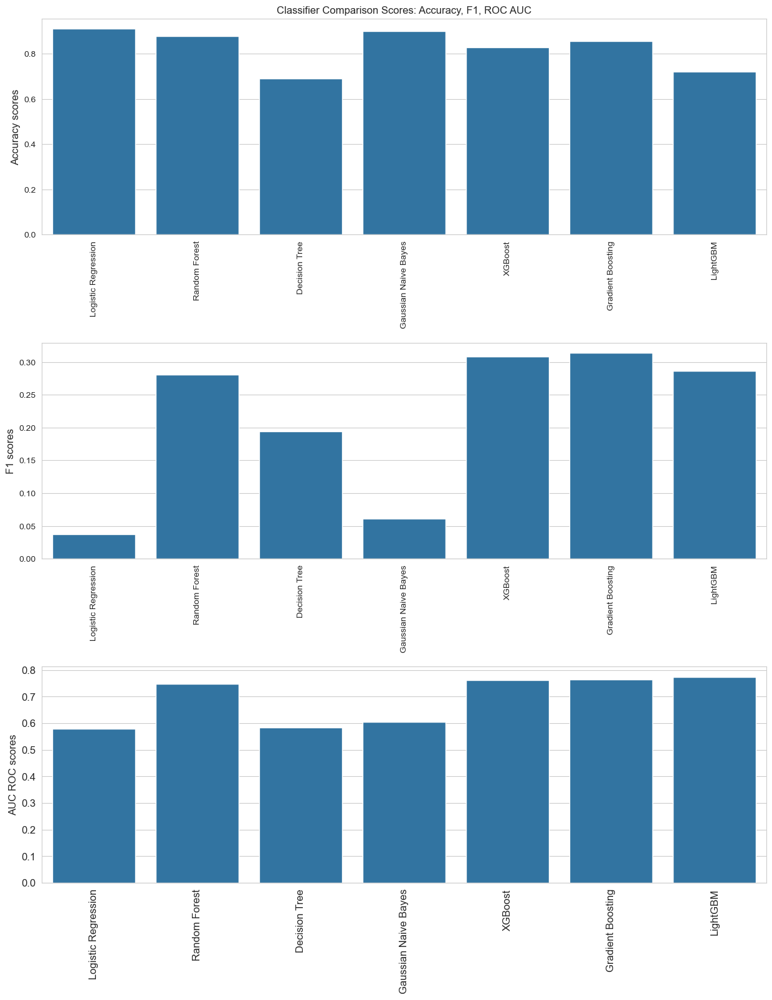

In [103]:
sns.set_color_codes("colorblind")
    
plt.figure(figsize=(15,18))
plt.subplot(311)
plt.title('Classifier Comparison Scores: Accuracy, F1, ROC AUC')
s1 = sns.barplot(x = classifier_names, y=accuracy_scores)
s1.set_xticklabels(s1.get_xticklabels(),rotation=90)
#s1.ylabel('accuracy scores', fontsize=12)
plt.ylabel('Accuracy scores', fontsize=12)
plt.subplot(312)
s2 = sns.barplot(x = classifier_names, y=f1_scores)
s2.set_xticklabels(s2.get_xticklabels(),rotation=90)
#s2.ylabel('F1 scores', fontsize=12)
plt.ylabel('F1 scores', fontsize=12)
plt.subplot(313)
s3 = sns.barplot(x = classifier_names, y=auc_scores)
s3.set_xticklabels(s3.get_xticklabels(),rotation=90)
plt.ylabel('AUC ROC scores', fontsize=12)
   
plt.tick_params(axis='both', which='major', labelsize=12)
plt.subplots_adjust(hspace = 0.5)
plt.show();

We can see from the comparisons of accuracy, F1 score and AUC ROC scores that all models have different rankings. The Logistic Regression and Gaussian Naive Bayes models have highest accuracy, but the lowest F1 scores. This shows that they do not work well for imbalanced data. The XGBoost, Gradient Boosting and LightGBM classifiers give good F1 and AUC ROC results. The AUC ROC scores can be better visualized using the ROC curves. 

Text(0, 0.5, 'True Positive Rate')

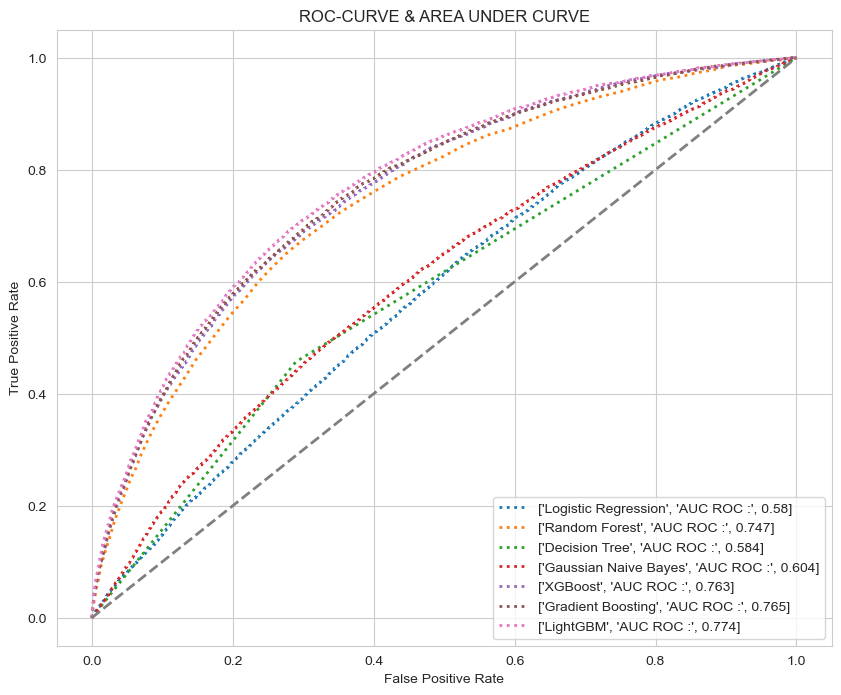

In [104]:
fig = plt.figure(figsize=(10,8))
ax  = fig.add_subplot(111)
    
ax.plot(fpr_logit,tpr_logit,label = [classifier_names[0], "AUC ROC :", round(auc_score_logit,3)],linewidth=2,linestyle="dotted")
ax.plot(fpr_rfc,tpr_rfc,label = [classifier_names[1], "AUC ROC :", round(auc_score_rfc,3)],linewidth=2,linestyle="dotted")
ax.plot(fpr_dtc,tpr_dtc,label = [classifier_names[2], "AUC ROC :", round(auc_score_dtc,3)],linewidth=2,linestyle="dotted")
ax.plot(fpr_gnb,tpr_gnb,label = [classifier_names[3], "AUC ROC :", round(auc_score_gnb,3)],linewidth=2,linestyle="dotted")
ax.plot(fpr_xgb,tpr_xgb,label = [classifier_names[4], "AUC ROC :", round(auc_score_xgb,3)],linewidth=2,linestyle="dotted")
ax.plot(fpr_gbc,tpr_gbc,label = [classifier_names[5], "AUC ROC :", round(auc_score_gbc,3)],linewidth=2,linestyle="dotted")
ax.plot(fpr_lgbc,tpr_lgbc,label = [classifier_names[6], "AUC ROC :", round(auc_score_lgbc,3)],linewidth=2,linestyle="dotted")

ax.plot([0,1],[0,1],linewidth=2,linestyle="dashed")
plt.legend(loc="best")
plt.title("ROC-CURVE & AREA UNDER CURVE")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

The AUC ROC scores improve as the curves rise higher above the diagonal. Since, the LightGBM classifier has the best score for AUC ROC (0.781), we can choose it while moving forward.


---

<b> 4.4 K-Fold Cross validation to improve model </b>

After choosing the classifier, we can use K-fold cross validation to train multiple iterations of the model by subsampling the validation data from the training dataset during different folds. This will help us choose parameters that correspond to the best performance without creating a separate validation dataset.  

In [105]:
def model_classify(model_in, dtrain_X, dtrain_Y, dtest_X, dtest_Y, n_folds = 5):
    
    """Train and test a model using cross validation. 
    """
       
    # Extract the ids
    train_ids = dtrain_X.index
    test_ids = dtest_X.index
    
    print('Training Data Shape: ', dtrain_X.shape)
    print('Testing Data Shape: ', dtest_X.shape)
    
    # Extract feature names
    feature_names = list(dtrain_X.columns)
    
    # Convert to np arrays
    features = np.array(dtrain_X)
    test_features = np.array(dtest_X)
    
    # Create the kfold object
    k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = 50)
    
    # Empty array for feature importances
    feature_importance_values = np.zeros(len(feature_names))
    
    # Empty array for test predictions
    predictions = np.zeros(test_features.shape[0])
    predictions_class = np.zeros(test_features.shape[0])
    
    # Empty array for out of fold validation predictions
    out_of_fold = np.zeros(features.shape[0])
    
    # Lists for recording validation and training scores
    valid_scores = []
    train_scores = []
    
    # print model
    
    print (model_in)
    
    # Iterate through each fold
    for train_indices, valid_indices in k_fold.split(features):
        
        
        # Training data for the fold
        train_features, train_labels = features[train_indices], dtrain_Y.iloc[train_indices]
        # Validation data for the fold
        valid_features, valid_labels = features[valid_indices], dtrain_Y.iloc[valid_indices]
        
        model = model_in
        
        # Train the model
        model.fit(
            train_features, train_labels,
            eval_metric='auc',
            eval_set=[(valid_features, valid_labels), (train_features, train_labels)],
            eval_names=['valid', 'train'],
            callbacks=[lgb.early_stopping(stopping_rounds=100), lgb.log_evaluation(period=200)]
        )
        
        # Record the best iteration
        best_iteration = model.best_iteration_
        
        # Record the feature importances
        feature_importance_values += model.feature_importances_ / k_fold.n_splits
        
        # Make predictions    
        predictions += model.predict_proba(test_features, num_iteration = best_iteration)[:, 1] / k_fold.n_splits
             
        
        # Record the out of fold predictions
        out_of_fold[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]
        
        # Record the best score
        valid_score = model.best_score_['valid']['auc']
        train_score = model.best_score_['train']['auc']
        
        valid_scores.append(valid_score)
        train_scores.append(train_score)
        
        # Clean up memory
        gc.enable()
        del train_features, valid_features
        gc.collect()
        
    # Make the predictions dataframe
    test_predictions = pd.DataFrame({'SK_ID_CURR': test_ids, 'TARGET': predictions})
    
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})
    
    # Overall validation score
    valid_auc = roc_auc_score(dtrain_Y, out_of_fold)
    
    # Add the overall scores to the metrics
    valid_scores.append(valid_auc)
    train_scores.append(np.mean(train_scores))
    
    # Needed for creating dataframe of validation scores
    fold_names = list(range(n_folds))
    fold_names.append('overall')
    
    
    # Dataframe of validation scores
    fold_scores = pd.DataFrame({'fold': fold_names,
                            'train': train_scores,
                            'valid': valid_scores}) 
    
    predictions_class = model.predict(test_features, num_iteration = best_iteration)

    
    fpr , tpr , thresholds   = roc_curve(dtest_Y,predictions)
    auc_roc = auc(fpr,tpr)
    f1_sc = f1_score(dtest_Y,predictions_class)
    accuracy = accuracy_score(dtest_Y,predictions_class)
    classify_metrics = classification_report(dtest_Y,predictions_class)
       
    print (model)
    
    return feature_importances, classify_metrics, fold_scores, accuracy, f1_sc, auc_roc, fpr, tpr 

The LightGBM classifier is trained with 5 folds to see which iteration gives the best ROC AUC scores

In [106]:
model = lgb.LGBMClassifier(n_estimators=10000, objective='binary', 
                           class_weight='balanced', learning_rate=0.05, 
                           reg_alpha=0.1, reg_lambda=0.1, 
                           subsample=0.8, n_jobs=-1, random_state=50)

feature_importances, classify_metrics, fold_scores, accuracy, f1_sc, auc_score, fpr, tpr = model_classify(
    model, df_undersampled_X, df_undersampled_Y, test_X, test_Y
)
print('Baseline metrics')
print(fold_scores)

Training Data Shape:  (55668, 253)
Testing Data Shape:  (76878, 253)
LGBMClassifier(class_weight='balanced', learning_rate=0.05, n_estimators=10000,
               n_jobs=-1, objective='binary', random_state=50, reg_alpha=0.1,
               reg_lambda=0.1, subsample=0.8)
[LightGBM] [Info] Number of positive: 14876, number of negative: 29658
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15457
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 230
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
Training until validation scores don't improve for 100 rounds
[200]	train's auc: 0.84453	train's binary_logloss: 0.505222	valid's auc: 0.766592	valid's binary_logloss: 0.568486
Early stopping, best iteration is:
[257]	train's auc: 0.

The training and validation scores are seen to be in the same range, showing that the model is not overfitting the data. The best iteration can then be used for prediction on test data

Accuracy score :  0.7160436015505086
F1 score :  0.2843092256245492
AUC :  0.7779412970384869
classification report :
               precision    recall  f1-score   support

           0       0.96      0.72      0.82     70609
           1       0.18      0.69      0.28      6269

    accuracy                           0.72     76878
   macro avg       0.57      0.70      0.55     76878
weighted avg       0.90      0.72      0.78     76878



Text(0, 0.5, 'True Positive Rate')

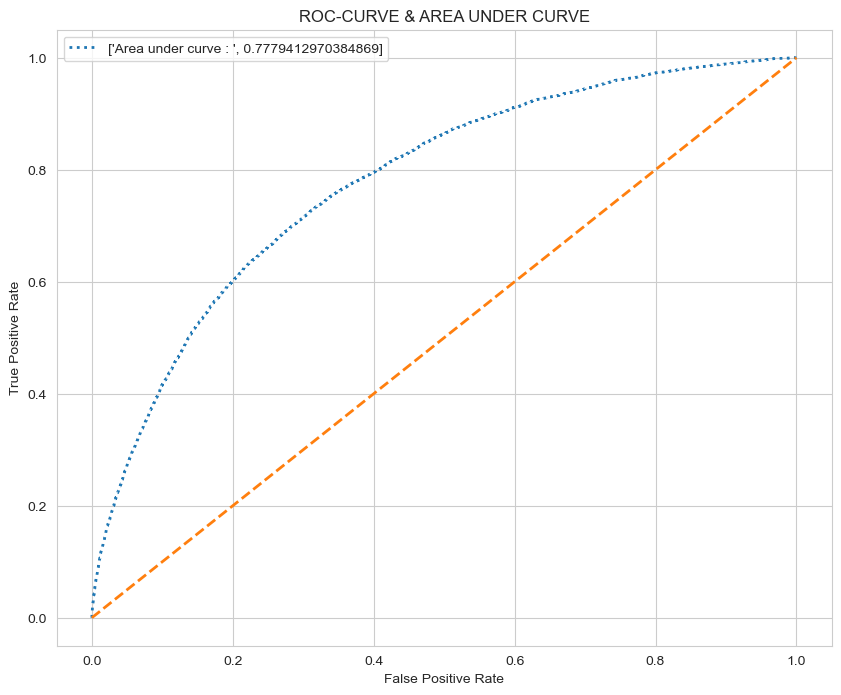

In [107]:
print ("Accuracy score : ", accuracy)
print ("F1 score : ", f1_sc)
print ("AUC : ", auc_score)
print ("classification report :\n", classify_metrics)
    
fig = plt.figure(figsize=(10,8))
ax  = fig.add_subplot(111)
ax.plot(fpr,tpr,label   = ["Area under curve : ",auc_score],linewidth=2,linestyle="dotted")
ax.plot([0,1],[0,1],linewidth=2,linestyle="dashed")
plt.legend(loc="best")
plt.title("ROC-CURVE & AREA UNDER CURVE")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

The ROC AUC score of 0.7834 on the test data shows that K-fold cross validation was able to improve the model fitting parameters. 

---

<b> 4.5 Comparing feature importance </b>

We can compare the feature importances for the LightGBM model with the base case (logistic regression) model using the following function.  

In [108]:
def plot_feature_importances(df):
    """
    Plot importances returned by a model. This can work with any measure of
    feature importance provided that higher importance is better. 
    """
    
    # Sort features according to importance
    df = df.sort_values('importance', ascending = False).reset_index()
    
    # Normalize the feature importances to add up to one
    df['importance_normalized'] = df['importance'] / df['importance'].sum()

    # Make a horizontal bar chart of feature importances
    plt.figure(figsize = (10, 6))
    ax = plt.subplot()
    
    # Need to reverse the index to plot most important on top
    ax.barh(list(reversed(list(df.index[:15]))), 
            df['importance_normalized'].head(15), 
            align = 'center', edgecolor = 'k')
    
    # Set the yticks and labels
    ax.set_yticks(list(reversed(list(df.index[:15]))))
    ax.set_yticklabels(df['feature'].head(15))
    
    # Plot labeling
    plt.xlabel('Normalized Importance'); plt.title('Feature Importances')
    plt.show()
    
    return df

First, examining the top 15 features of the LightGBM model, we can see that it contains a number of features that were created from domain knowledge and through the automated feature engineering (DFS) process. Among the original features, a number of them are those that had a high loan default rate during exploratory data analysis.

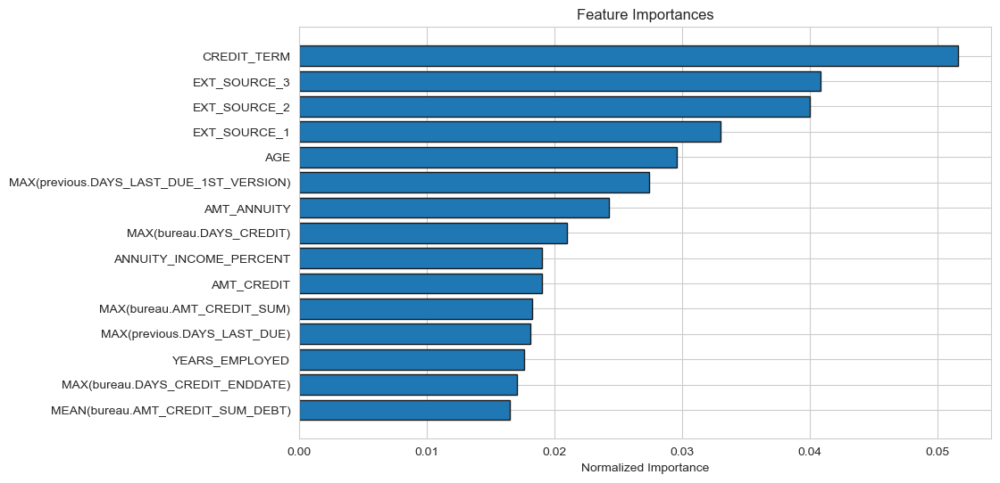

In [109]:
# Show the feature importances for the new features
feature_importances_sorted = plot_feature_importances(feature_importances)

Looking at the top 15 features of the base case model, we can see that it contains a number of features that we saw had a high loan default rate during exploratory data analysis.

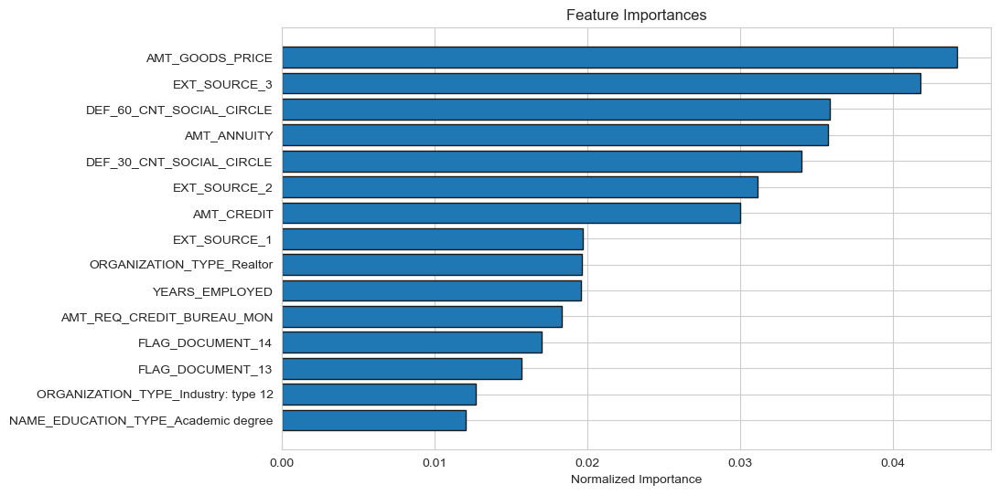

In [110]:
# Show the feature importances for the default features
feature_importances_sorted = plot_feature_importances(feature_importances_logit_base)


---

### <b> 5.0 Hyperparameter Tuning </b>

After choosing LightGBM as the binary classifier, we can tune the hyperparameters for improving the model results through grid search, random search, and Bayesian optimization

---

<b> 5.1 Pre-processing </b>

The hyperparameter tuning process needs an objective function, the domain space, optimization algorithm to give the results.

First, the data is prepared for model training.

In [130]:
random.seed(50)

#Remove possible JSON characters
df_undersampled_X = df_undersampled_X.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
df_undersampled_Y = df_undersampled_Y.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_X = test_X.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_Y = test_Y.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

# Create a training and testing dataset
train_set = lgb.Dataset(data = df_undersampled_X, label = df_undersampled_Y)
test_set = lgb.Dataset(data = test_X, label = test_Y)

The domain space is the range of hyperparameters over which the tuning process will be carried out. As seen below there are number of hyperparameters that can be modified. This grid can be used for grid/random search.

In [131]:
# Hyperparameter grid
param_grid = {
    'boosting_type': ['gbdt', 'goss'],
    'num_leaves': list(range(20, 150)),
    'learning_rate': list(np.logspace(np.log10(0.005), np.log10(0.5), base = 10, num = 1000)),
    'subsample_for_bin': list(range(20000, 300000, 20000)),
    'min_child_samples': list(range(20, 500, 5)),
    'reg_alpha': list(np.linspace(0, 1)),
    'reg_lambda': list(np.linspace(0, 1)),
    'colsample_bytree': list(np.linspace(0.6, 1, 10)),
    'subsample': list(np.linspace(0.5, 1, 100)),
    'is_unbalance': [True, False]
}

N_FOLDS = 5

The results of the tuning process will can be saved in the following dataframes

In [132]:
# Dataframes for random and grid search
# Number of iterations for Random / Grid search
MAX_EVALS = 50 

random_results = pd.DataFrame(columns = ['score', 'params', 'iteration'],
                              index = list(range(MAX_EVALS)))

grid_results = pd.DataFrame(columns = ['score', 'params', 'iteration'],
                              index = list(range(MAX_EVALS)))

The objective function is the one which takes the input hyperparameters to test different models and optimize the values over multiple iterations. The function use cross-validation for each major iteration to minimize the loss (1- ROC AUC score). It also saves the ROC AUC scores, and the hyperparameter values for each iteration, and the function can be used for all 3 methods. 

In [133]:
OUT_FILE = "grid_search_results.csv"

In [134]:
def objective(hyperparameters):
    """Objective function for LightGBM Hyperparameter Optimization"""

    global ITERATION
    ITERATION += 1
    print('current iteration:', ITERATION)

    # Remove n_estimators if present
    hyperparameters.pop('n_estimators', None)

    # Convert integer parameters
    for p in ['num_leaves', 'subsample_for_bin', 'min_child_samples']:
        if p in hyperparameters:
            hyperparameters[p] = int(hyperparameters[p])

    # Handle GOSS correctly
    if hyperparameters.get('boosting_type') == 'goss':
        hyperparameters['subsample'] = 1.0
        hyperparameters['data_sample_strategy'] = 'goss'

    # ⛔ DO NOT reuse Dataset — create it here
    train_set = lgb.Dataset(
        df_undersampled_X,
        label=df_undersampled_Y,
        free_raw_data=False
    )

    start = timer()

    cv_results = lgb.cv(
        params=hyperparameters,
        train_set=train_set,
        num_boost_round=10000,
        nfold=N_FOLDS,
        metrics='auc',
        seed=50,
        callbacks=[
            lgb.early_stopping(stopping_rounds=100),
            lgb.log_evaluation(period=100)
        ]
    )

    run_time = timer() - start

    # Detect auc key safely
    auc_key = next(k for k in cv_results if 'auc' in k.lower())
    best_score = cv_results[auc_key][-1]

    loss = 1 - best_score
    n_estimators = len(cv_results[auc_key])
    hyperparameters['n_estimators'] = n_estimators

    # Save results
    with open(OUT_FILE, 'a', newline='') as f:
        writer = csv.writer(f)
        writer.writerow([loss, hyperparameters, ITERATION, run_time, best_score])

    return {
        'loss': loss,
        'hyperparameters': hyperparameters,
        'iteration': ITERATION,
        'train_time': run_time,
        'score': best_score,
        'status': STATUS_OK
    }


---

<b> 5.2 Grid Search </b>

The grid search algorithm iterates over the hyperparameters incrementally to explore the entire domain space. However, the exhaustive search is very time consuming and cannot be completed with finite computing resources. 

In [135]:
def grid_search(param_grid, max_evals = MAX_EVALS):
    """Grid search algorithm (with limit on max evals)"""
    
    # Dataframe to store results
    results = pd.DataFrame(columns = ['score', 'params', 'iteration'],
                              index = list(range(MAX_EVALS)))
    
    # https://codereview.stackexchange.com/questions/171173/list-all-possible-permutations-from-a-python-dictionary-of-lists
    keys, values = zip(*param_grid.items())
    
    global ITERATION
    
    ITERATION = 0
    
    # Iterate through every possible combination of hyperparameters
    for v in itertools.product(*values):
        
        start = timer()
        
        # Create a hyperparameter dictionary
        hyperparameters = dict(zip(keys, v))
        
        # Set the subsample ratio accounting for boosting type
        hyperparameters['subsample'] = 1.0 if hyperparameters['boosting_type'] == 'goss' else hyperparameters['subsample']
        
        # Evalute the hyperparameters
        
        dict_return = objective(hyperparameters)
        eval_results = at(dict_return, 'score', 'hyperparameters', 'iteration')
           
        results.loc[ITERATION-1, :] = eval_results
        
        run_time = timer() - start
    
        print('run time:', run_time)
        
        # Normally would not limit iterations
        if ITERATION-1 > MAX_EVALS:
            break
       
    # Sort with best score on top
    results.sort_values('score', ascending = False, inplace = True)
    results.reset_index(inplace = True)
    
    return results

The created function can theoretically run on the entire domain space but is limited to maximum of 20 evaluations due to time and computational constraints.

In [136]:
MAX_EVALS = 20

grid_results = grid_search(param_grid)

print('The best validation score was {:.5f}'.format(grid_results.loc[0, 'score']))
print('\nThe best hyperparameters were:')

current iteration: 1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14695
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14695
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14695
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 232
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023669 seconds.
Yo

In [137]:
pprint.pprint(grid_results.loc[0, 'params'])

{'boosting_type': 'gbdt',
 'colsample_bytree': 0.6,
 'is_unbalance': True,
 'learning_rate': 0.004999999999999999,
 'min_child_samples': 20,
 'n_estimators': 6848,
 'num_leaves': 20,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 0.5,
 'subsample_for_bin': 20000}


In [138]:
# Get the best grid parameters
grid_best_params = grid_results.loc[0, 'params']

# Create, train, test model
model = lgb.LGBMClassifier(**grid_best_params, random_state = 42)
model.fit(df_undersampled_X, df_undersampled_Y)

preds = model.predict_proba(test_X)[:, 1]

print('The best model from grid search scores {:.5f} ROC AUC on the test set.'.format(roc_auc_score(test_Y, preds)))

[LightGBM] [Info] Number of positive: 18556, number of negative: 37112
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14713
[LightGBM] [Info] Number of data points in the train set: 55668, number of used features: 233
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
The best model from grid search scores 0.77936 ROC AUC on the test set.


The best hyperparameters identified from the limited grid search and the ROC AUC score on test data are as given above

---

<b> 5.3 Random Search </b>

The random search algorithm selects hyperparameters from the domain space in a random manner. With limited resources, it can act as a preferred strategy due to a less exhaustive search and high possibility of finding good hyperparameter combinations 

In [139]:
def random_search(param_grid, max_evals = MAX_EVALS):
    """Random search for hyperparameter optimization"""
    
    # Dataframe for results
    results = pd.DataFrame(columns = ['score', 'params', 'iteration'],
                                  index = list(range(MAX_EVALS)))
    global ITERATION 
    
    ITERATION = 0
    
    # Keep searching until reach max evaluations
    for ITERATION in range(MAX_EVALS):
        
        start = timer()
        
        # Choose random hyperparameters
        hyperparameters = {k: random.sample(v, 1)[0] for k, v in param_grid.items()}
        hyperparameters['subsample'] = 1.0 if hyperparameters['boosting_type'] == 'goss' else hyperparameters['subsample']

        # Evaluate randomly selected hyperparameters
        dict_return = objective(hyperparameters)
        eval_results = at(dict_return, 'score', 'hyperparameters', 'iteration')
        
        results.loc[ITERATION-1, :] = eval_results
        
        run_time = timer() - start
    
        print('run time:', run_time)
    
    # Sort with best score on top
    results.sort_values('score', ascending = False, inplace = True)
    results.reset_index(inplace = True)
    return results

The created function can be run for a long time to search optimal combinations in the domain space but is limited to maximum of 50 evaluations due to time and computational constraints.

In [140]:
MAX_EVALS = 50

random_results = random_search(param_grid)

print('The best validation score was {:.5f}'.format(random_results.loc[0, 'score']))
print('\nThe best hyperparameters were:')

pprint.pprint(random_results.loc[0, 'params'])

current iteration: 1
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15772
[LightGBM] [Info] Number of data points in the train set: 44534, number of used

In [141]:
# Get the best parameters
random_best_params = random_results.loc[0, 'params']

# Create, train, test model
model = lgb.LGBMClassifier(**random_best_params, random_state = 42)
model.fit(df_undersampled_X, df_undersampled_Y)

preds = model.predict_proba(test_X)[:, 1]

print('The best model from random search scores {:.5f} ROC AUC on the test set.'.format(roc_auc_score(test_Y, preds)))

[LightGBM] [Info] Number of positive: 18556, number of negative: 37112
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15714
[LightGBM] [Info] Number of data points in the train set: 55668, number of used features: 173
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
The best model from random search scores 0.78149 ROC AUC on the test set.


The best hyperparameters identified from the random search and the ROC AUC score on test data are as given above

---

<b> 5.4 Bayesian optimization </b>

The Bayesian method, unlike the previous uninformed methods uses the results of the previous iteration to decide the next hyperparameter combination in the domain space. It uses the [Hyperopt library](https://github.com/hyperopt/hyperopt) using the Tree Parzen Estimator algorithm to select the next hyperparameter values for evaluation in the objective function.

The search space is defined as required

In [142]:
# Define the search space
space = {
    'boosting_type': hp.choice('boosting_type', ['gbdt', 'goss']),
    'num_leaves': hp.quniform('num_leaves', 31, 255, 1),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
    'subsample': hp.uniform('subsample', 0.6, 1.0),
    'subsample_for_bin': hp.quniform('subsample_for_bin', 20000, 300000, 20000),
    'min_child_samples': hp.quniform('min_child_samples', 10, 200, 5),
    'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    'is_unbalance': hp.choice('is_unbalance', [True, False]),
}


# Create the Tree Parzen Estimator algorithm
tpe_algorithm = tpe.suggest

# Record results
trials = Trials()

The created function can be run for a long time to search optimal combinations in the domain space but is limited to maximum of 50 evaluations due to time and computational constraints.

In [143]:
MAX_EVALS = 50

# Create a new file and open a connection
OUT_FILE = 'bayesian_trials.csv'
of_connection = open(OUT_FILE, 'w')
writer = csv.writer(of_connection)

# Write column names
headers = ['loss', 'hyperparameters', 'iteration', 'runtime', 'score']
writer.writerow(headers)
of_connection.close()

# Record results
trials = Trials()

global ITERATION

ITERATION = 0 

#function to call objective function and choose hyperparameters

best = fmin(fn = objective, space = space, algo = tpe.suggest,
            trials = trials, max_evals = MAX_EVALS)

# Sort the trials with lowest loss (highest AUC) first
trials_dict = sorted(trials.results, key = lambda x: x['loss'])

print('Finished, best results')
print(trials_dict[:1])

# Save the trial results
with open('trials.json', 'w') as f:
    f.write(json.dumps(trials_dict))

current iteration:                                    
1                                                     
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15772                    
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 199
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15772                    
[LightGBM] [Info] Number of data points in the train set: 44534, number of used features: 199
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15772        

In [144]:
# Get the best parameters
Bayesian_best_params = trials_dict[0]['hyperparameters'].copy()

# Remove CV-only keys
Bayesian_best_params.pop('data_sample_strategy', None)

# Ensure correct types
for p in ['num_leaves', 'min_child_samples', 'subsample_for_bin']:
    Bayesian_best_params[p] = int(Bayesian_best_params[p])

# Handle GOSS
if Bayesian_best_params['boosting_type'] == 'goss':
    Bayesian_best_params['subsample'] = 1.0
# Create, train, test model
model = lgb.LGBMClassifier(**Bayesian_best_params, random_state = 42)
model.fit(df_undersampled_X, df_undersampled_Y)

preds = model.predict_proba(test_X)[:, 1]

print('The best model from Bayesian search scores {:.5f} ROC AUC on the test set.'.format(roc_auc_score(test_Y, preds)))

[LightGBM] [Info] Number of positive: 18556, number of negative: 37112
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15788
[LightGBM] [Info] Number of data points in the train set: 55668, number of used features: 207
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
The best model from Bayesian search scores 0.78110 ROC AUC on the test set.


The best hyperparameters identified from the Bayesian optimization process and the ROC AUC score on test data are as given above

---

The best model predictions can be saved in a csv file

In [145]:
print(type(test_Y), test_Y.shape)
print(type(preds), preds.shape)

<class 'pandas.core.frame.DataFrame'> (76878, 1)
<class 'numpy.ndarray'> (76878,)


In [146]:
#Save predictions

final_predictions_test = pd.DataFrame({
    'SK_ID_CURR': test_Y.index.values,
    'TARGET_actual': test_Y.values.ravel(),
    'TARGET_pred': preds.ravel()
})

final_predictions_test.to_csv('final_predictions_test.csv', index=False)


---

<b> 5.5 Comparison of the tuning methods </b>

The ROC AUC validation scores from all three methods for different iterations can be compared to see trends

In [147]:
# Dataframe of Grid search scores

scores_g = pd.DataFrame({'ROC_AUC': grid_results['score'], 'iteration': grid_results['iteration'], 'search': 'Grid'})

scores_g['ROC_AUC'] = scores_g['ROC_AUC'].astype(np.float32)
scores_g['iteration'] = scores_g['iteration'].astype(np.int32)

scores_g.head()

,ROC_AUC,iteration,search
0,0.775191,1,Grid
1,0.775191,2,Grid
2,0.775191,21,Grid
3,0.775191,20,Grid
4,0.775191,19,Grid


In [148]:
# Dataframe of Random scores

scores_r = pd.DataFrame({'ROC_AUC': random_results['score'], 'iteration': random_results['iteration'], 'search': 'Random'})

scores_r['ROC_AUC'] = scores_r['ROC_AUC'].astype(np.float32)
scores_r['iteration'] = scores_r['iteration'].astype(np.int32)

scores_r.head()

,ROC_AUC,iteration,search
0,0.776533,11,Random
1,0.775650,20,Random
2,0.774887,46,Random
3,0.774768,37,Random
4,0.774738,18,Random


In [149]:
score_b =[]
iteration_b=[]

for key in range(len(trials_dict)):
    score_b.append(trials_dict[key]['score'])
    iteration_b.append(trials_dict[key]['iteration'])

In [150]:
# Dataframe of Bayesian scores

scores_b = pd.DataFrame({'ROC_AUC': score_b, 'iteration': iteration_b, 'search': 'Bayesian'})

scores_b['ROC_AUC'] = scores_b['ROC_AUC'].astype(np.float32)
scores_b['iteration'] = scores_b['iteration'].astype(np.int32)
scores_b.head()

,ROC_AUC,iteration,search
0,0.776066,44,Bayesian
1,0.775492,33,Bayesian
2,0.775356,28,Bayesian
3,0.775145,31,Bayesian
4,0.774990,30,Bayesian


The best validation scores for each method are identified

In [151]:
best_grid_score = scores_g.iloc[scores_g['ROC_AUC'].idxmax(), :].copy()
best_random_score = scores_r.iloc[scores_r['ROC_AUC'].idxmax(), :].copy()
best_bayes_score = scores_b.iloc[scores_b['ROC_AUC'].idxmax(), :].copy()

The scores for each method are combined and plotted for increasing iterations

In [152]:
all_scores = pd.concat([scores_b.assign(dataset='Bayesian'), scores_r.assign(dataset='Random'), scores_g.assign(dataset='Grid')])

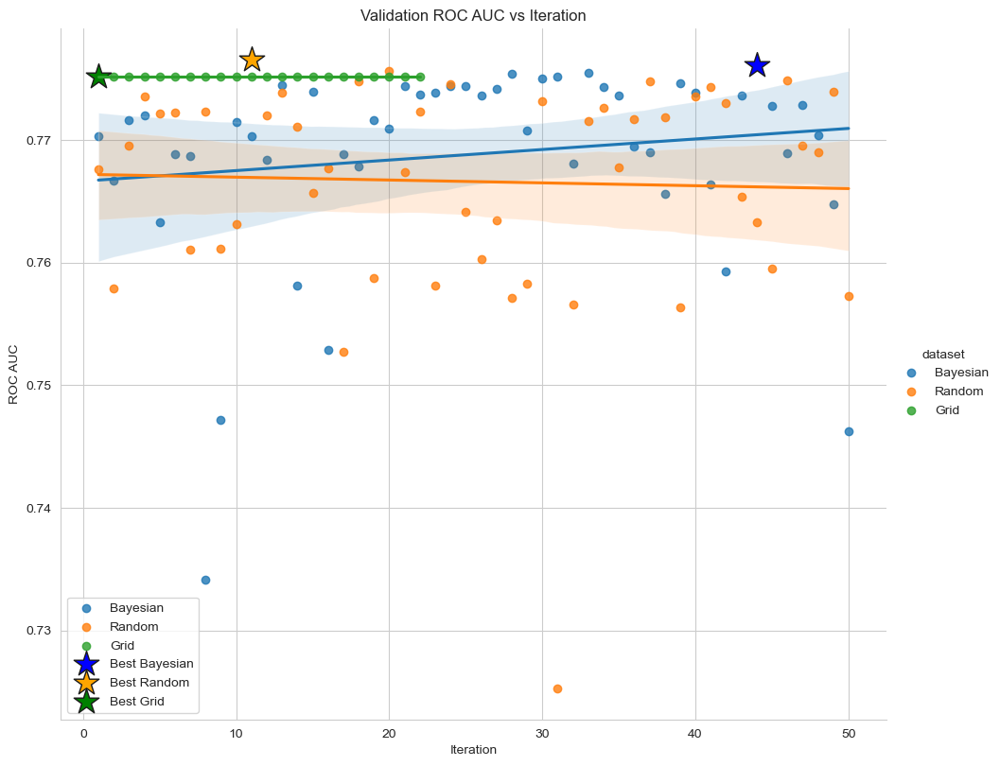

In [153]:
# Plot of scores over the course of searching
sns.lmplot(
    x='iteration',
    y='ROC_AUC',
    data=all_scores,
    hue='dataset',
    height=8,
    aspect=1.2
)

plt.scatter(
    best_bayes_score['iteration'],
    best_bayes_score['ROC_AUC'],
    marker='*', s=400, c='blue', edgecolor='k', label='Best Bayesian'
)

plt.scatter(
    best_random_score['iteration'],
    best_random_score['ROC_AUC'],
    marker='*', s=400, c='orange', edgecolor='k', label='Best Random'
)

plt.scatter(
    best_grid_score['iteration'],
    best_grid_score['ROC_AUC'],
    marker='*', s=400, c='green', edgecolor='k', label='Best Grid'
)

plt.xlabel('Iteration')
plt.ylabel('ROC AUC')
plt.title('Validation ROC AUC vs Iteration')
plt.legend()
plt.show()


We can the behaviors of each tuning method with increasing iterations in the above figure. The grid search scores do not differ much since during each iteration, only one hyperparameter is incrementally changed. The random search scores are scattered with no noticeable trend but have the highest validation ROC AUC score simply by finding a favorable combination. The Bayesian search can be observed to have progressively better scores with increasing iterations as expected, and if the number of iterations were increased could have surpassed the score from random method

In [7]:
os.getcwd()

'C:\\Users\\chand\\Downloads\\Home Loan Default Risk Prediction System'

In [163]:
models_path = os.path.join("models")
os.makedirs(models_path, exist_ok=True)

In [164]:
import joblib

model_path = os.path.join(models_path, "best_lightgbm_bayesian_model.pkl")
joblib.dump(model, model_path)


['models\\best_lightgbm_bayesian_model.pkl']

In [113]:
joblib.dump(scaler, "models/scaler.pkl")

['models/scaler.pkl']

In [114]:
joblib.dump(features, "models/feature_names.pkl")

['models/feature_names.pkl']

In [115]:
imputer = DataFrameImputer().fit(train)
joblib.dump(imputer, "models/imputer.pkl")

['models/imputer.pkl']

## CONCLUSION 

In this project, a LightGBM classifier was developed and optimized to handle an imbalanced classification problem. Hyperparameter tuning was performed using Grid Search, Random Search, and Bayesian Optimization. The Grid Search model achieved a validation ROC AUC of approximately 0.774, while Random Search achieved around 0.773. Bayesian Optimization outperformed both methods, achieving the highest validation ROC AUC of approximately 0.775 and the best test ROC AUC performance. Additionally, Bayesian Optimization showed a consistent improvement trend across iterations, indicating better convergence and efficient exploration of the hyperparameter space. Therefore, the Bayesian-optimized LightGBM model was selected as the final model for deployment due to its superior predictive performance and robustness.

Furthermore, undersampling was applied to address class imbalance, which helped improve the model’s sensitivity toward minority class predictions. The final model demonstrated stable generalization performance on unseen test data, indicating minimal overfitting. The ROC AUC trends across iterations confirmed the reliability of Bayesian Optimization in identifying optimal hyperparameters efficiently. Overall, the proposed approach provides a scalable and effective solution for real-world classification problems with imbalanced data.

The Bayesian-optimized LightGBM model predicts the likelihood of loan default and thereby helps identify customer segments that are eligible for taking a loan.
By learning complex patterns from applicant demographic, financial, and credit-related features, the model effectively distinguishes low-risk customers from high-risk ones. This enables financial institutions to make informed, data-driven lending decisions while minimizing credit risk and improving approval accuracy.